<a href="https://colab.research.google.com/github/mia2465/PMLTermProject/blob/main/VAEFilterTesting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##### Copyright 2020 The TensorFlow Authors.

In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Convolutional Variational Autoencoder

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/generative/cvae">
    <img src="https://www.tensorflow.org/images/tf_logo_32px.png" />
    View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/cvae.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />
    Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/cvae.ipynb">
    <img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />
    View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/generative/cvae.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

## Setup

This code is largely alterations from TensorFlows official example for VAE's. The links for this official site and lisensing information are shown above this cell.

This VAE variation is specifically for testing which size of filters results in the most accurate recreation of the origional pictures when put through a VAE.

In [ ]:
!pip install tensorflow-probability

# to generate gifs
!pip install imageio
!pip install git+https://github.com/tensorflow/docs
#!pip install pydicom

from google.colab import drive
drive.mount('/content/drive')

from IPython import display

import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import tensorflow_probability as tfp
import time
import pandas as pd


Required data sets that were created via the preprocessing files in other sections of the repository.

In [ ]:
#This is for the set in which 98% of all the CT scans are used for testing
train_dataset = tf.data.Dataset.load('/content/drive/MyDrive/AllDICOM/trainSet128')

In [ ]:
#This is for the set in which 98% of all the CT scans are used for training
test_dataset = tf.data.Dataset.load('/content/drive/MyDrive/AllDICOM/testSet128')

In [ ]:
# For 98% data set
train_size =  8,718
batch_size = 32
test_size =  178

Requried functions for the VAE to function.

In [ ]:
def generate_and_save_images(model, epoch, test_sample):
  mean, logvar = model.encode(test_sample)
  z = model.reparameterize(mean, logvar)
  predictions = model.sample(z)
  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
    plt.subplot(4, 4, i + 1)
    plt.imshow(predictions[i, :, :, 0], cmap='gray')
    plt.axis('off')

  # tight_layout minimizes the overlap between 2 sub-plots
  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

In [ ]:
# Pick a sample of the test set for generating output images
assert batch_size >= num_examples_to_generate
for test_batch in test_dataset.take(1):
  test_sample = test_batch[0:num_examples_to_generate, :, :, :]

In [ ]:
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

 Actual running and experimentation of the VAE. The end results from this testing shows the value difference between the normalized pixel values of the origional and the ones ran through the VAE for each filter amount.

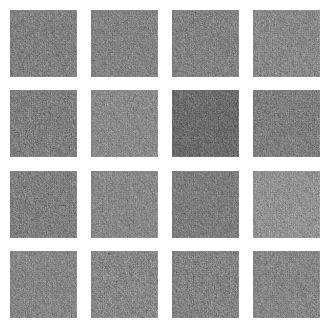

Epoch: 1, Test set ELBO: -7388.84033203125, time elapse for current epoch: 9.211413145065308


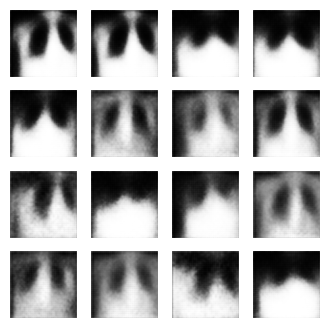

Epoch: 2, Test set ELBO: -6657.47314453125, time elapse for current epoch: 6.965500593185425


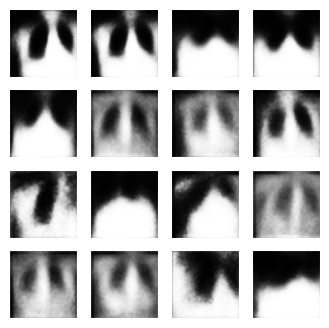

Epoch: 3, Test set ELBO: -6575.388671875, time elapse for current epoch: 7.14967942237854


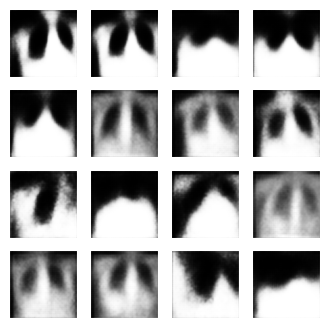

Epoch: 4, Test set ELBO: -6483.12548828125, time elapse for current epoch: 7.110721111297607


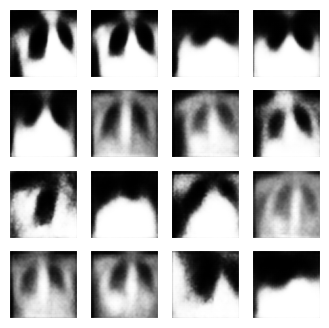

Epoch: 5, Test set ELBO: -6426.658203125, time elapse for current epoch: 6.95672607421875


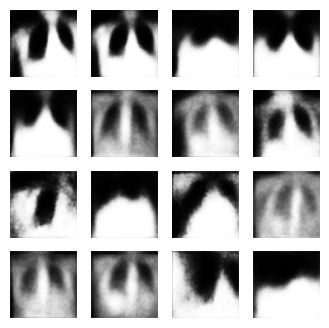

Epoch: 6, Test set ELBO: -6401.62158203125, time elapse for current epoch: 6.881299734115601


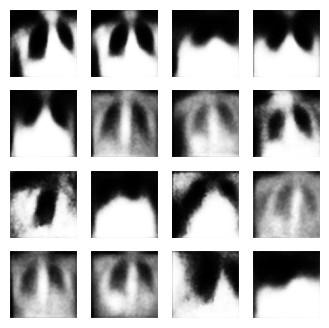

Epoch: 7, Test set ELBO: -6380.47509765625, time elapse for current epoch: 6.761922597885132


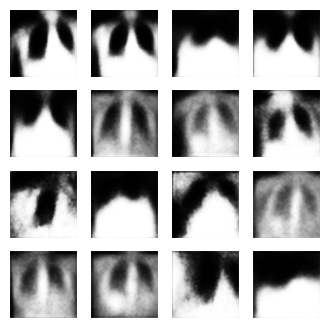

Epoch: 8, Test set ELBO: -6363.3125, time elapse for current epoch: 6.719031810760498


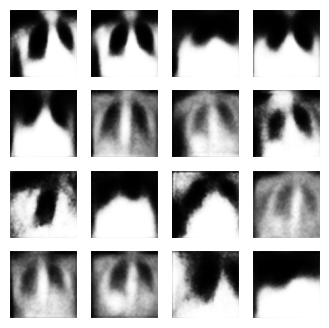

Epoch: 9, Test set ELBO: -6356.76416015625, time elapse for current epoch: 6.70732855796814


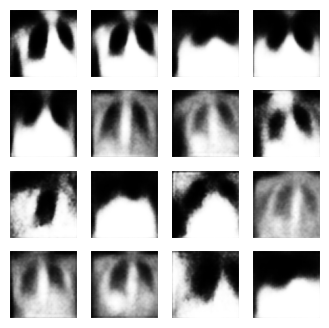

Epoch: 10, Test set ELBO: -6352.16259765625, time elapse for current epoch: 6.700835704803467


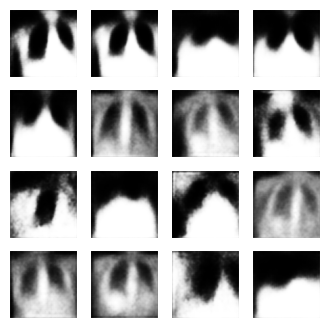

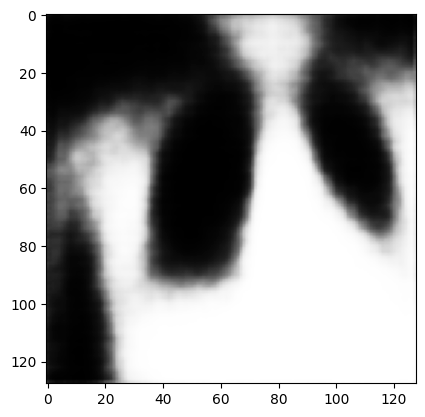

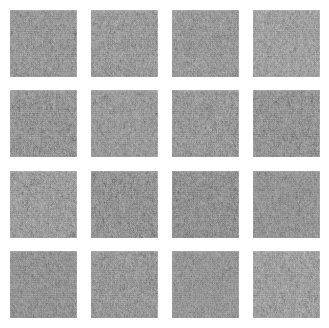

Epoch: 1, Test set ELBO: -7231.03564453125, time elapse for current epoch: 8.960140705108643


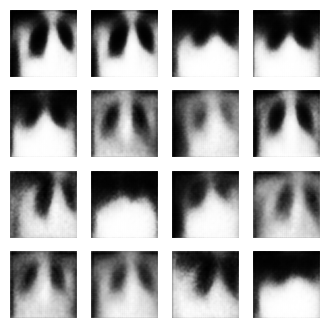

Epoch: 2, Test set ELBO: -6616.47900390625, time elapse for current epoch: 6.742393493652344


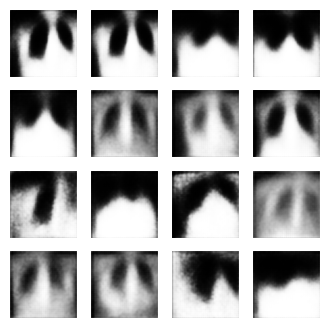

Epoch: 3, Test set ELBO: -6558.93994140625, time elapse for current epoch: 6.8715362548828125


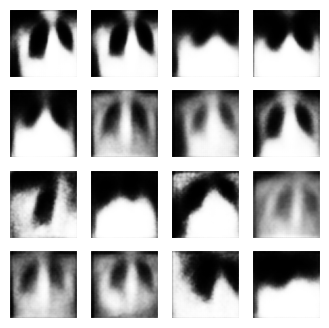

Epoch: 4, Test set ELBO: -6469.7421875, time elapse for current epoch: 7.093740701675415


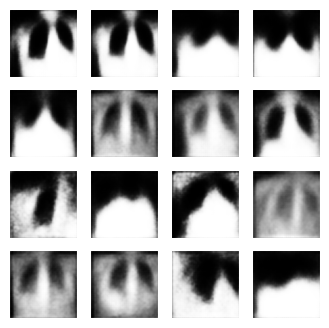

Epoch: 5, Test set ELBO: -6426.48828125, time elapse for current epoch: 7.006992340087891


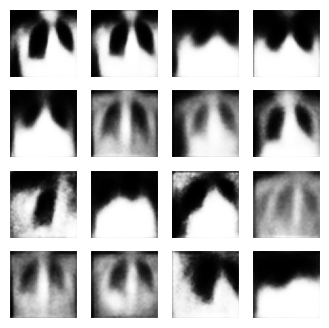

Epoch: 6, Test set ELBO: -6398.15771484375, time elapse for current epoch: 6.8835413455963135


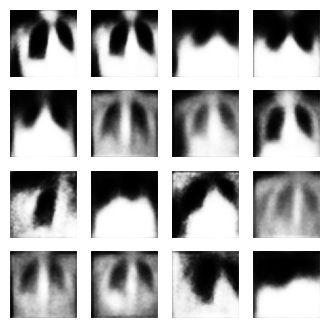

Epoch: 7, Test set ELBO: -6386.31787109375, time elapse for current epoch: 6.801262378692627


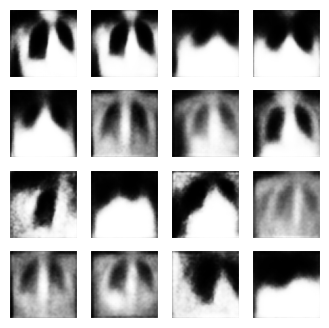

Epoch: 8, Test set ELBO: -6380.66162109375, time elapse for current epoch: 6.762475967407227


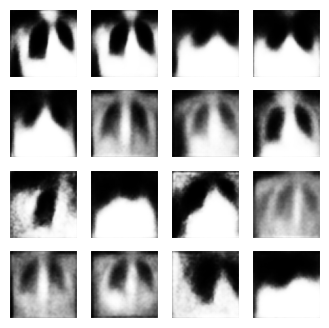

Epoch: 9, Test set ELBO: -6376.74365234375, time elapse for current epoch: 6.797282934188843


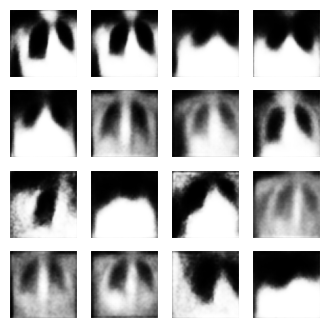

Epoch: 10, Test set ELBO: -6357.57958984375, time elapse for current epoch: 6.7403974533081055


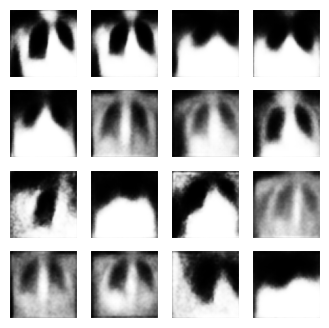

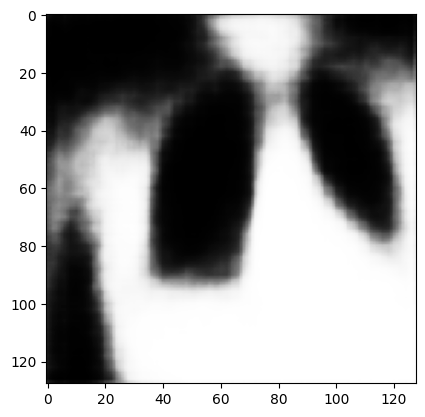

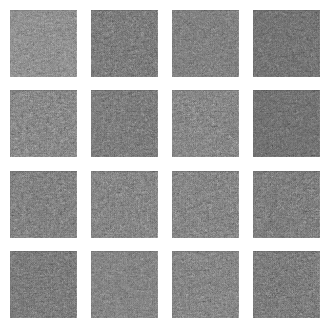

Epoch: 1, Test set ELBO: -7477.25146484375, time elapse for current epoch: 9.106985330581665


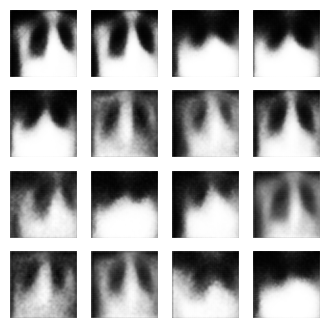

Epoch: 2, Test set ELBO: -6692.07275390625, time elapse for current epoch: 6.805410385131836


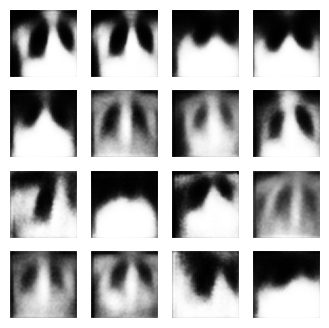

Epoch: 3, Test set ELBO: -6674.77099609375, time elapse for current epoch: 6.8649818897247314


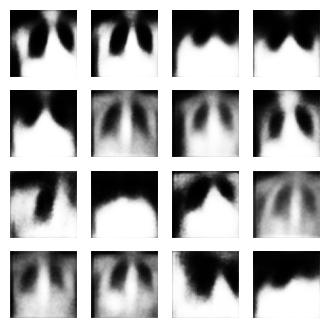

Epoch: 4, Test set ELBO: -6520.11083984375, time elapse for current epoch: 6.950423717498779


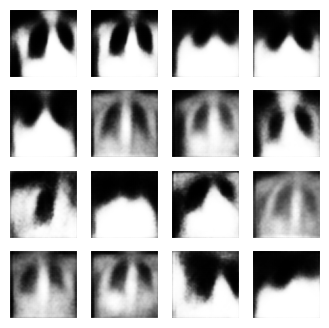

Epoch: 5, Test set ELBO: -6453.30322265625, time elapse for current epoch: 7.021058797836304


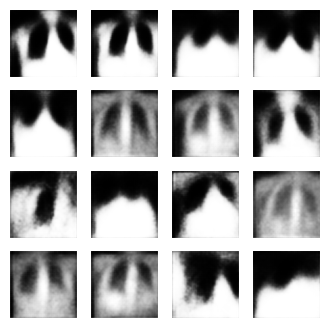

Epoch: 6, Test set ELBO: -6428.09619140625, time elapse for current epoch: 6.861180543899536


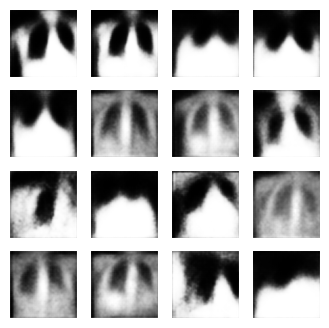

Epoch: 7, Test set ELBO: -6405.51513671875, time elapse for current epoch: 6.814416885375977


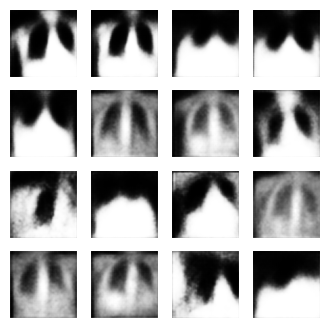

Epoch: 8, Test set ELBO: -6408.98486328125, time elapse for current epoch: 6.7892701625823975


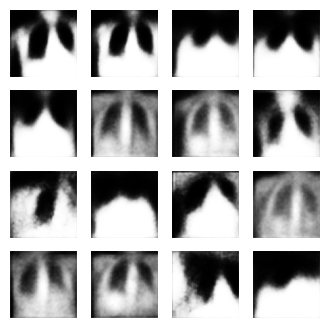

Epoch: 9, Test set ELBO: -6383.423828125, time elapse for current epoch: 6.786212921142578


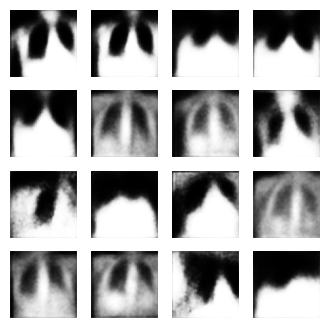

Epoch: 10, Test set ELBO: -6359.84814453125, time elapse for current epoch: 6.8418028354644775


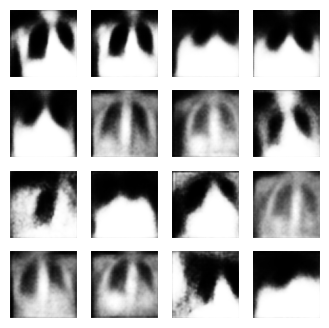

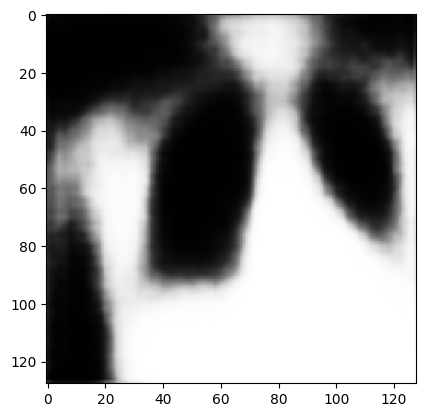

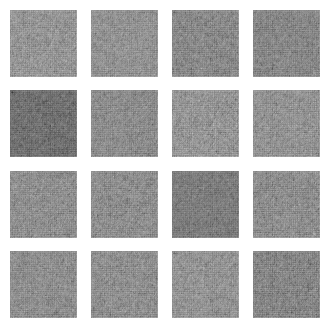

Epoch: 1, Test set ELBO: -7300.55810546875, time elapse for current epoch: 8.94368290901184


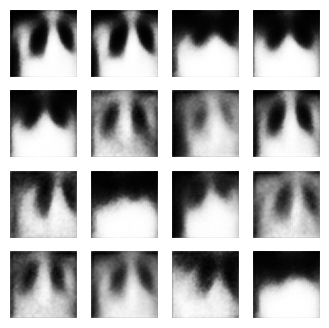

Epoch: 2, Test set ELBO: -6624.13427734375, time elapse for current epoch: 6.78126335144043


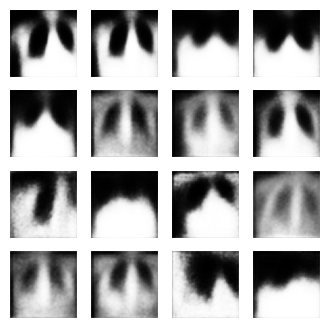

Epoch: 3, Test set ELBO: -6534.53125, time elapse for current epoch: 6.905645847320557


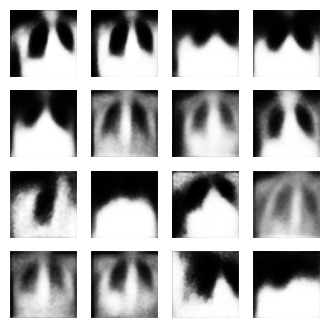

Epoch: 4, Test set ELBO: -6496.71142578125, time elapse for current epoch: 6.900125980377197


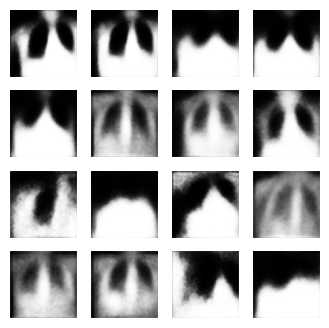

Epoch: 5, Test set ELBO: -6444.79541015625, time elapse for current epoch: 6.862917184829712


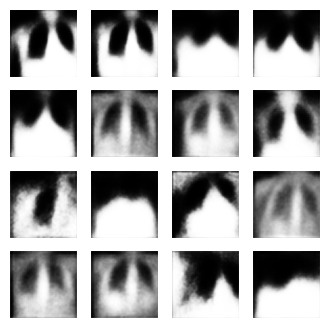

Epoch: 6, Test set ELBO: -6415.96142578125, time elapse for current epoch: 6.8433427810668945


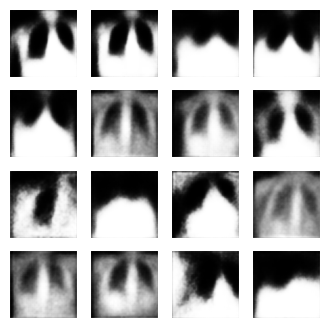

Epoch: 7, Test set ELBO: -6387.23095703125, time elapse for current epoch: 6.810507297515869


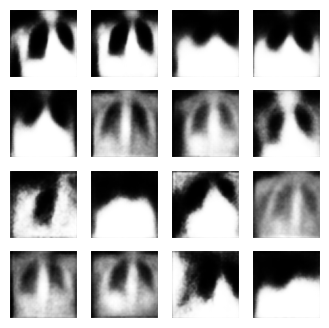

Epoch: 8, Test set ELBO: -6366.01708984375, time elapse for current epoch: 6.865358352661133


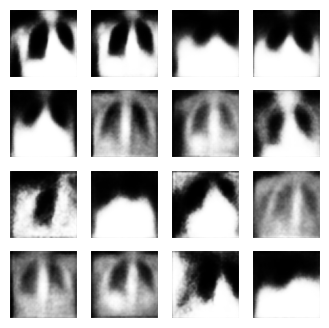

Epoch: 9, Test set ELBO: -6347.296875, time elapse for current epoch: 6.800030946731567


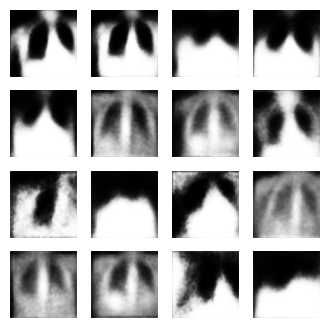

Epoch: 10, Test set ELBO: -6338.21240234375, time elapse for current epoch: 6.776671409606934


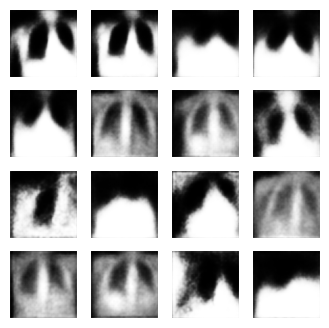

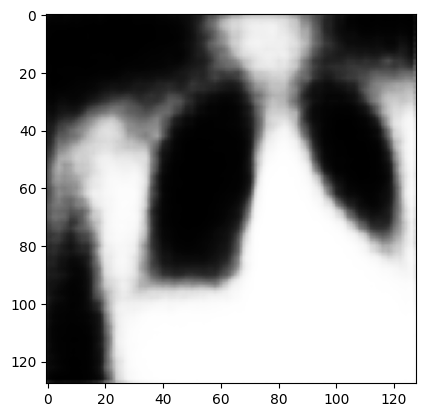

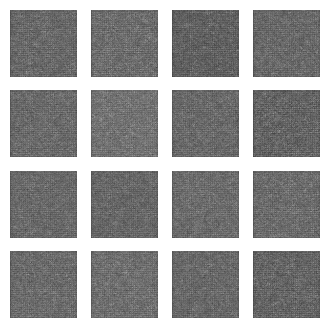

Epoch: 1, Test set ELBO: -8625.0224609375, time elapse for current epoch: 9.783794164657593


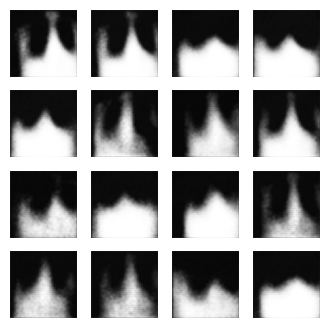

Epoch: 2, Test set ELBO: -6821.1953125, time elapse for current epoch: 6.783295631408691


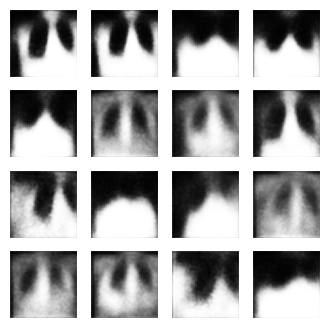

Epoch: 3, Test set ELBO: -6651.99755859375, time elapse for current epoch: 6.9105987548828125


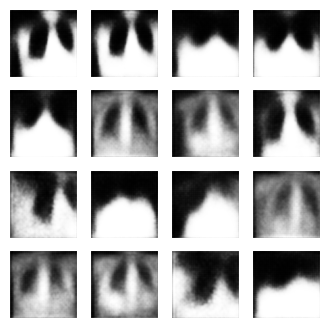

Epoch: 4, Test set ELBO: -6584.84375, time elapse for current epoch: 6.998755216598511


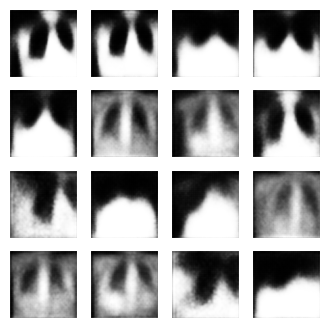

Epoch: 5, Test set ELBO: -6545.17578125, time elapse for current epoch: 6.929741144180298


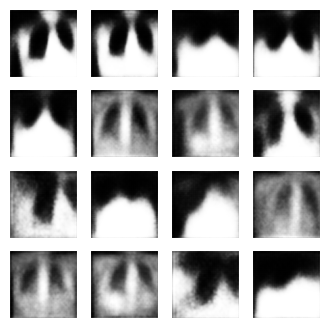

Epoch: 6, Test set ELBO: -6525.76025390625, time elapse for current epoch: 6.876231908798218


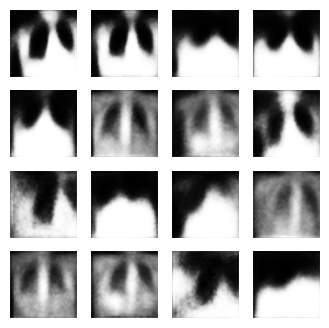

Epoch: 7, Test set ELBO: -6486.08203125, time elapse for current epoch: 6.83179235458374


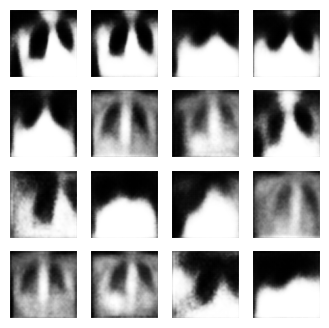

Epoch: 8, Test set ELBO: -6477.58203125, time elapse for current epoch: 6.790579557418823


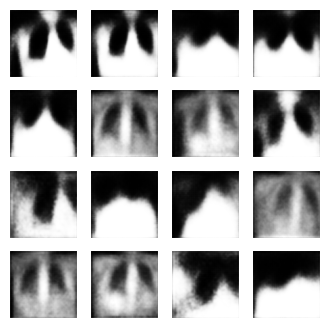

Epoch: 9, Test set ELBO: -6471.78759765625, time elapse for current epoch: 6.778088092803955


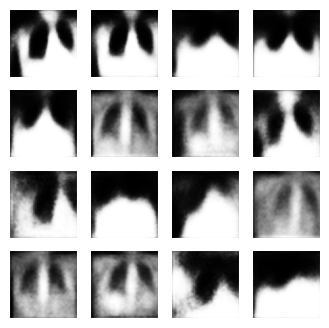

Epoch: 10, Test set ELBO: -6463.85498046875, time elapse for current epoch: 6.754416465759277


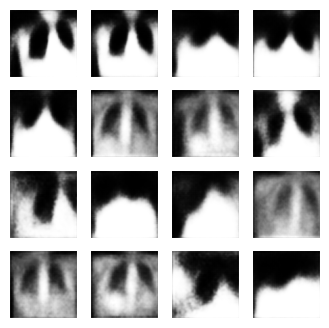

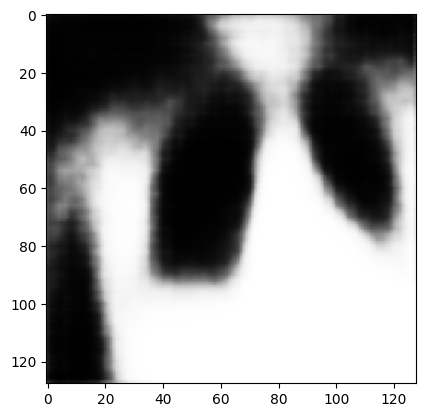

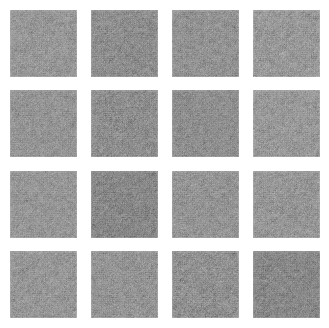

Epoch: 1, Test set ELBO: -6867.75, time elapse for current epoch: 21.16762375831604


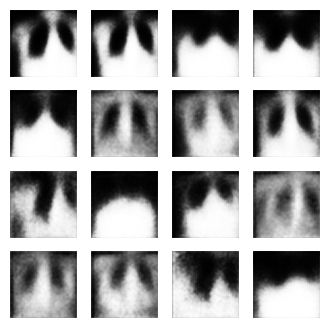

Epoch: 2, Test set ELBO: -6534.05419921875, time elapse for current epoch: 15.152387142181396


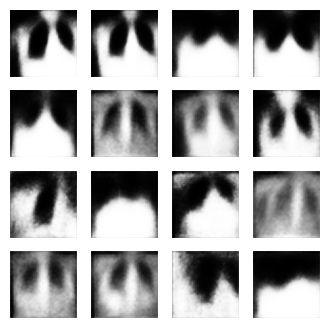

Epoch: 3, Test set ELBO: -6508.86767578125, time elapse for current epoch: 15.005998134613037


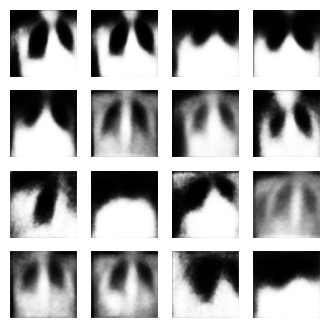

Epoch: 4, Test set ELBO: -6424.42822265625, time elapse for current epoch: 14.862738609313965


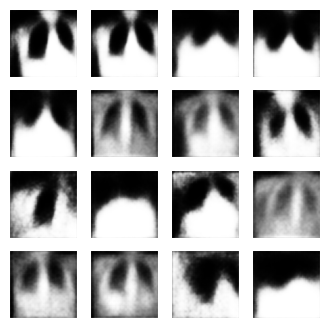

Epoch: 5, Test set ELBO: -6420.14794921875, time elapse for current epoch: 14.828378915786743


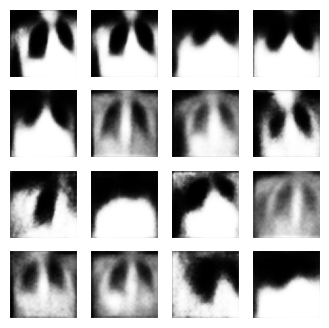

Epoch: 6, Test set ELBO: -6366.78955078125, time elapse for current epoch: 14.925701141357422


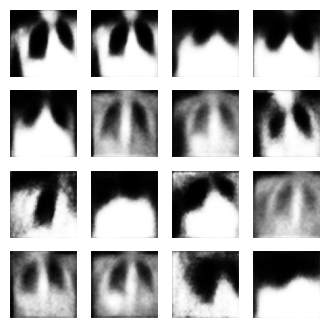

Epoch: 7, Test set ELBO: -6374.298828125, time elapse for current epoch: 14.926802158355713


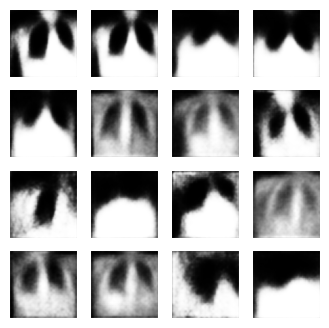

Epoch: 8, Test set ELBO: -6395.6328125, time elapse for current epoch: 14.960792064666748


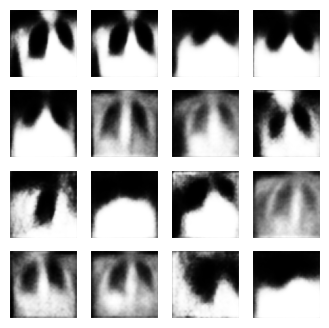

Epoch: 9, Test set ELBO: -6351.9375, time elapse for current epoch: 14.919591903686523


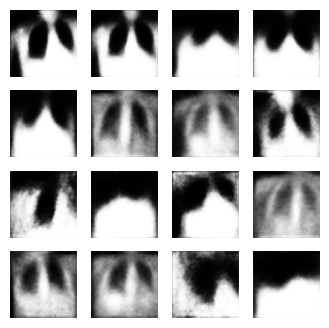

Epoch: 10, Test set ELBO: -6345.23681640625, time elapse for current epoch: 14.942564249038696


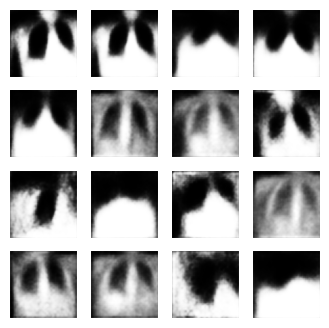

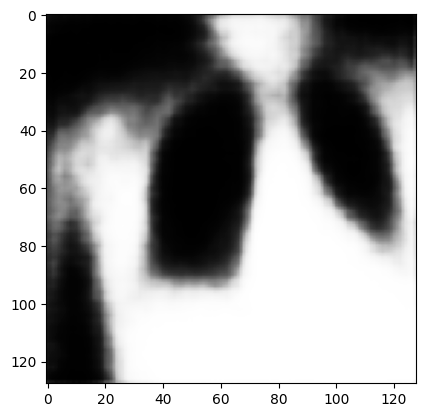

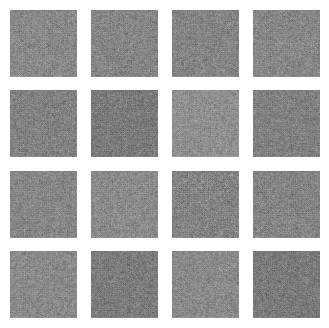

Epoch: 1, Test set ELBO: -6974.65576171875, time elapse for current epoch: 16.99005889892578


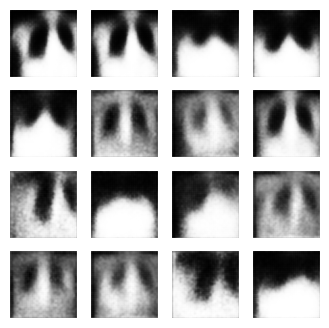

Epoch: 2, Test set ELBO: -6564.11181640625, time elapse for current epoch: 15.052129983901978


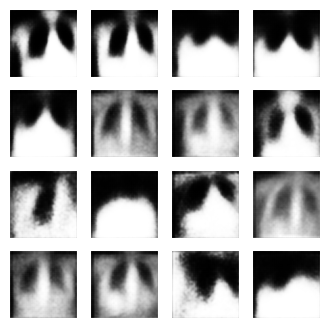

Epoch: 3, Test set ELBO: -6462.69482421875, time elapse for current epoch: 15.107469081878662


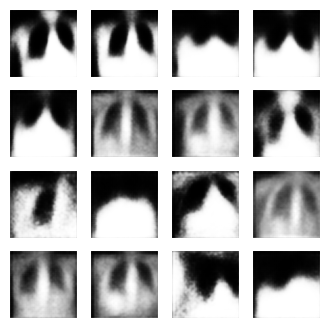

Epoch: 4, Test set ELBO: -6408.48828125, time elapse for current epoch: 14.979730367660522


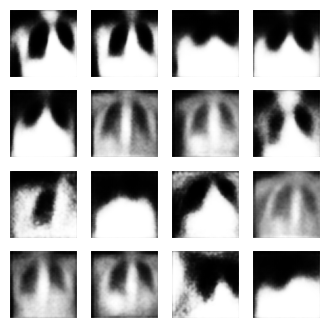

Epoch: 5, Test set ELBO: -6373.95458984375, time elapse for current epoch: 14.911596775054932


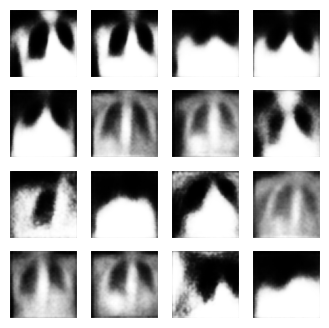

Epoch: 6, Test set ELBO: -6343.35986328125, time elapse for current epoch: 14.899145126342773


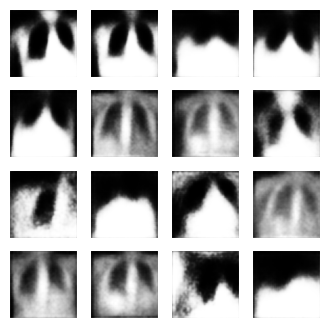

Epoch: 7, Test set ELBO: -6331.865234375, time elapse for current epoch: 14.910388231277466


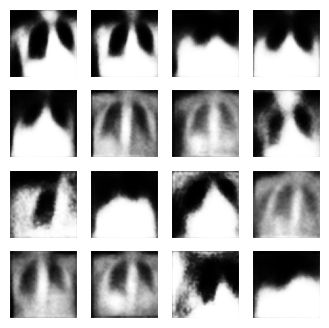

Epoch: 8, Test set ELBO: -6328.423828125, time elapse for current epoch: 14.933854579925537


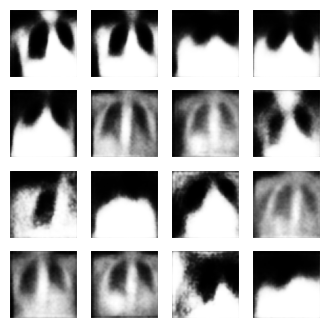

Epoch: 9, Test set ELBO: -6362.10888671875, time elapse for current epoch: 14.986972093582153


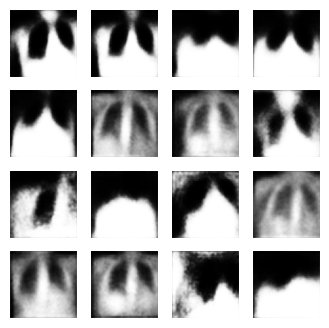

Epoch: 10, Test set ELBO: -6317.765625, time elapse for current epoch: 14.967522621154785


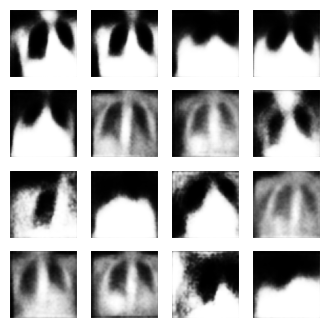

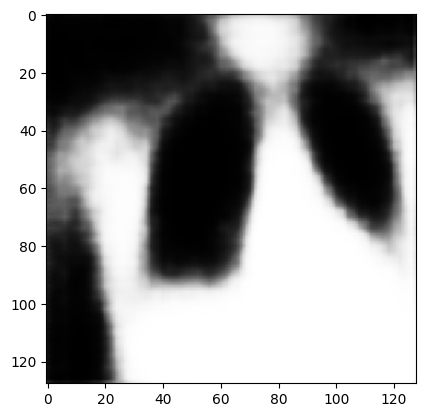

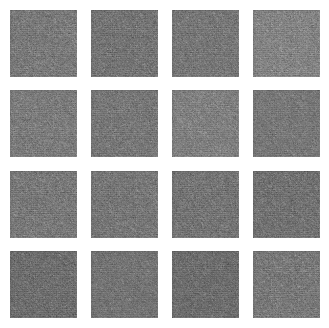

Epoch: 1, Test set ELBO: -6970.986328125, time elapse for current epoch: 17.04303216934204


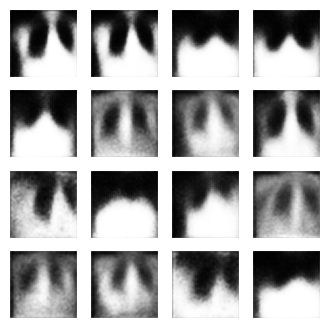

Epoch: 2, Test set ELBO: -6618.30859375, time elapse for current epoch: 15.02290391921997


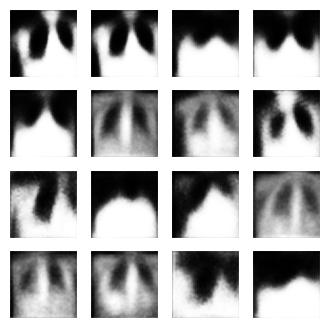

Epoch: 3, Test set ELBO: -6533.48876953125, time elapse for current epoch: 20.49902606010437


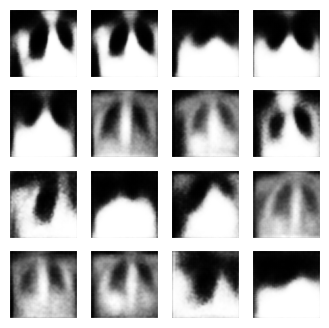

Epoch: 4, Test set ELBO: -6478.13037109375, time elapse for current epoch: 14.806987524032593


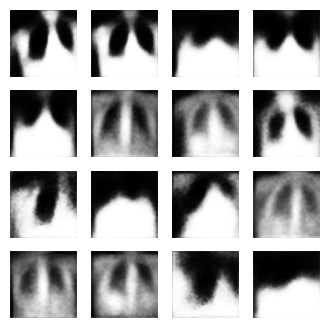

Epoch: 5, Test set ELBO: -6443.390625, time elapse for current epoch: 14.985637903213501


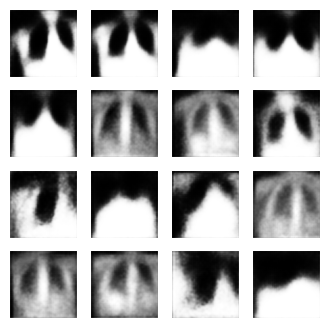

Epoch: 6, Test set ELBO: -6429.97119140625, time elapse for current epoch: 14.967027187347412


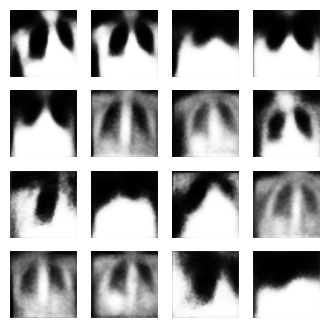

Epoch: 7, Test set ELBO: -6419.81005859375, time elapse for current epoch: 14.91920256614685


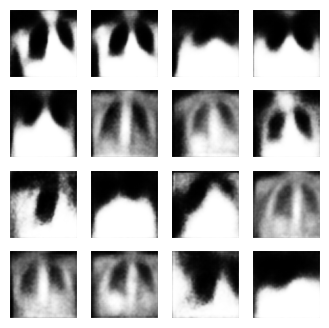

Epoch: 8, Test set ELBO: -6396.97509765625, time elapse for current epoch: 14.875333786010742


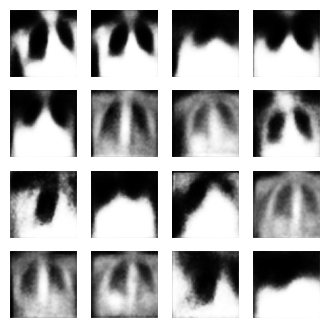

Epoch: 9, Test set ELBO: -6393.84912109375, time elapse for current epoch: 14.902902126312256


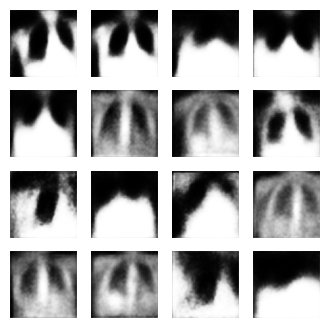

Epoch: 10, Test set ELBO: -6386.51171875, time elapse for current epoch: 14.942473411560059


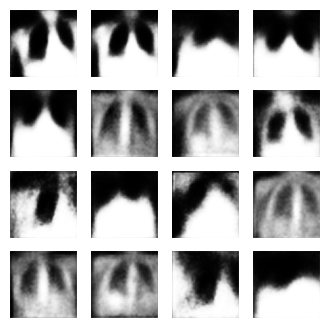

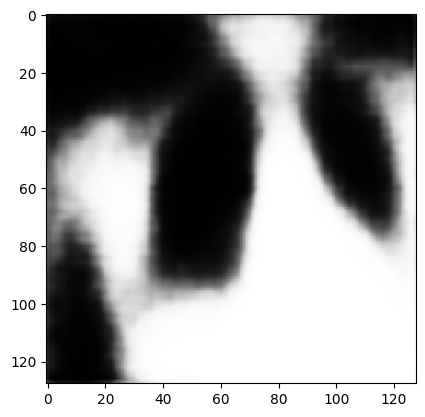

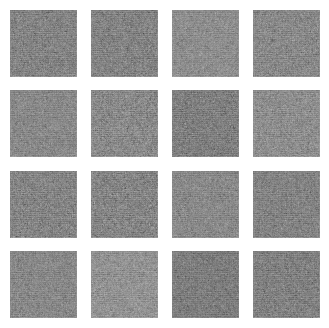

Epoch: 1, Test set ELBO: -6931.33154296875, time elapse for current epoch: 17.173189401626587


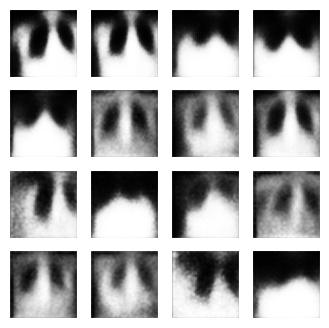

Epoch: 2, Test set ELBO: -6527.17626953125, time elapse for current epoch: 15.148075819015503


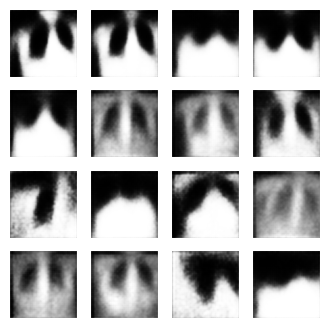

Epoch: 3, Test set ELBO: -6466.55615234375, time elapse for current epoch: 15.002366065979004


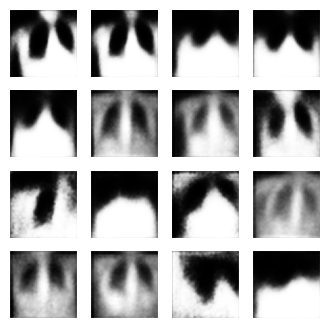

Epoch: 4, Test set ELBO: -6410.49609375, time elapse for current epoch: 14.925954103469849


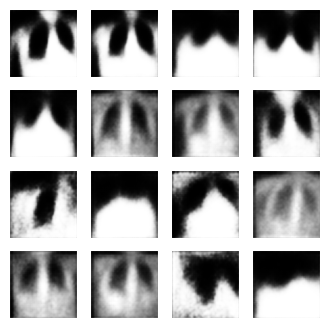

Epoch: 5, Test set ELBO: -6392.07275390625, time elapse for current epoch: 14.89176321029663


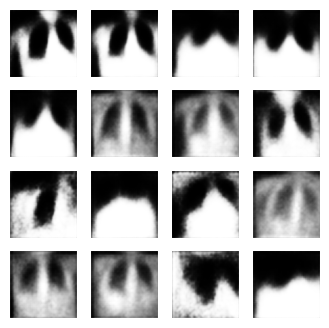

Epoch: 6, Test set ELBO: -6360.32470703125, time elapse for current epoch: 14.976240396499634


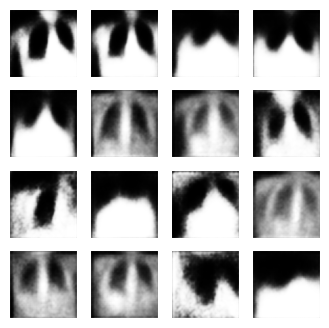

Epoch: 7, Test set ELBO: -6361.85693359375, time elapse for current epoch: 15.061803102493286


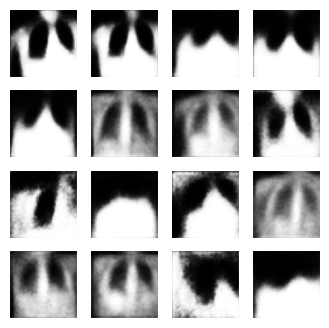

Epoch: 8, Test set ELBO: -6379.88525390625, time elapse for current epoch: 14.989384174346924


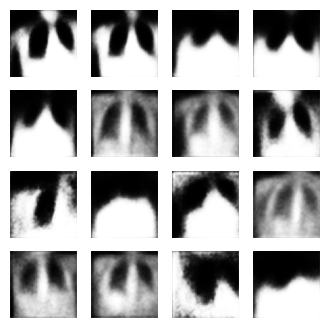

Epoch: 9, Test set ELBO: -6343.83349609375, time elapse for current epoch: 14.943980932235718


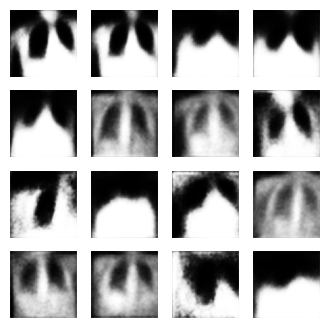

Epoch: 10, Test set ELBO: -6334.18798828125, time elapse for current epoch: 15.009456396102905


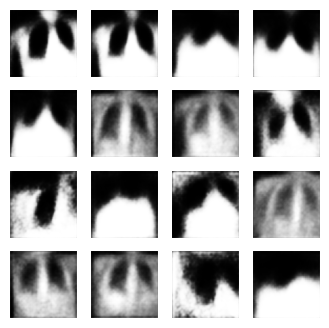

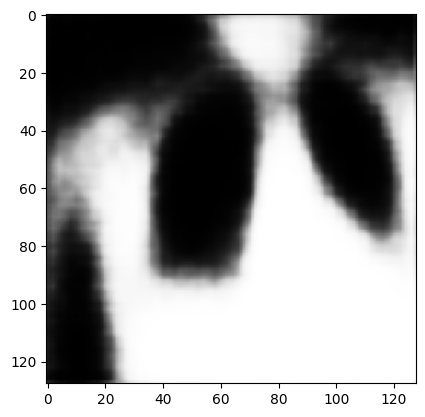

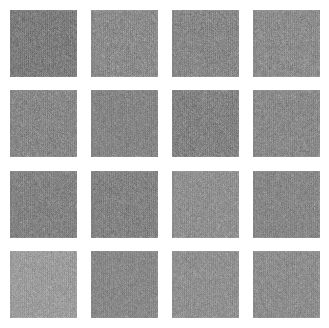

Epoch: 1, Test set ELBO: -7147.90283203125, time elapse for current epoch: 16.93950080871582


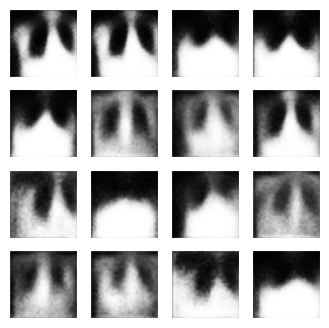

Epoch: 2, Test set ELBO: -6666.859375, time elapse for current epoch: 15.06203031539917


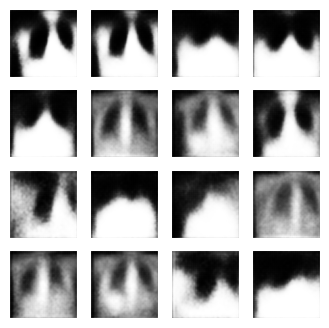

Epoch: 3, Test set ELBO: -6567.59912109375, time elapse for current epoch: 15.169477462768555


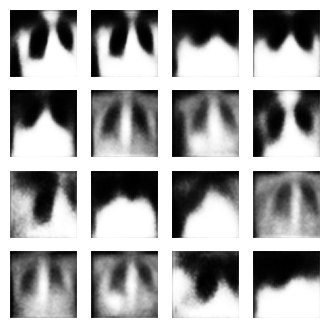

Epoch: 4, Test set ELBO: -6515.15087890625, time elapse for current epoch: 14.971155166625977


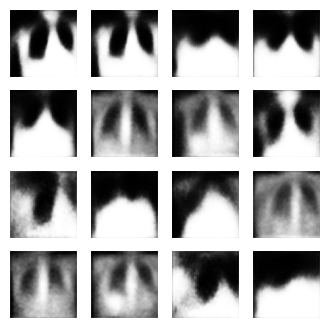

Epoch: 5, Test set ELBO: -6469.337890625, time elapse for current epoch: 14.899564743041992


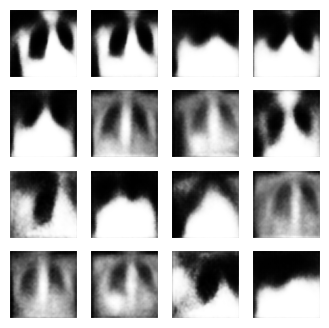

Epoch: 6, Test set ELBO: -6438.91357421875, time elapse for current epoch: 14.891602277755737


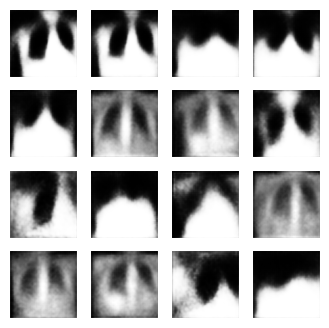

Epoch: 7, Test set ELBO: -6421.986328125, time elapse for current epoch: 14.933658599853516


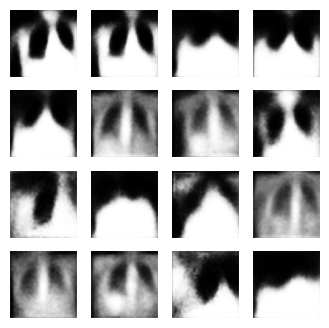

Epoch: 8, Test set ELBO: -6411.080078125, time elapse for current epoch: 14.9725501537323


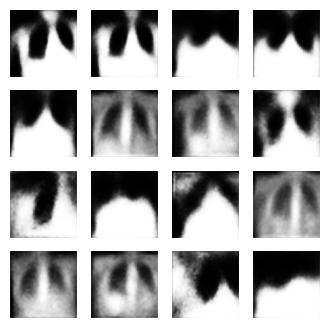

Epoch: 9, Test set ELBO: -6384.37109375, time elapse for current epoch: 15.001476764678955


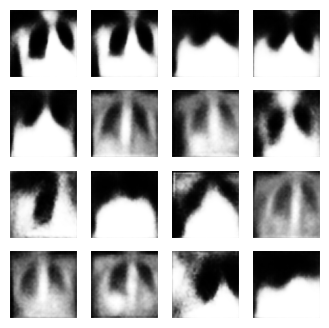

Epoch: 10, Test set ELBO: -6368.041015625, time elapse for current epoch: 14.963331937789917


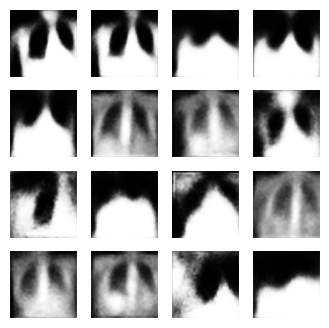

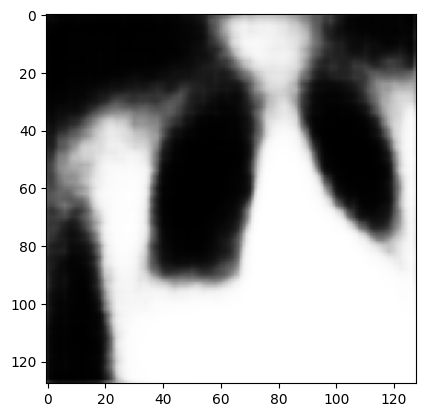

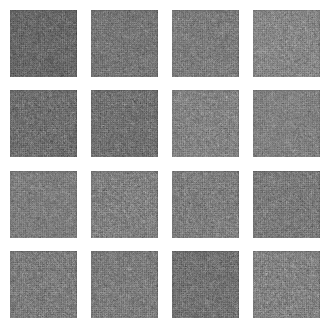

Epoch: 1, Test set ELBO: -6946.3828125, time elapse for current epoch: 33.93920564651489


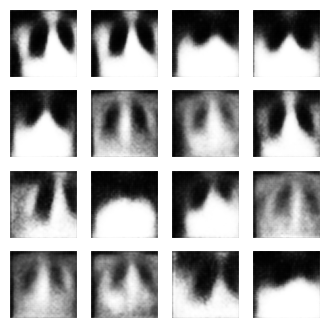

Epoch: 2, Test set ELBO: -6604.189453125, time elapse for current epoch: 27.059426069259644


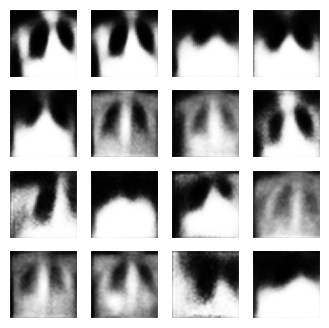

Epoch: 3, Test set ELBO: -6512.544921875, time elapse for current epoch: 26.845836400985718


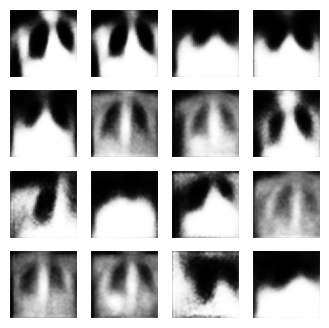

Epoch: 4, Test set ELBO: -6466.97119140625, time elapse for current epoch: 26.863199472427368


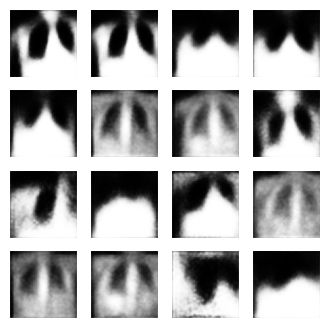

Epoch: 5, Test set ELBO: -6435.125, time elapse for current epoch: 26.93893814086914


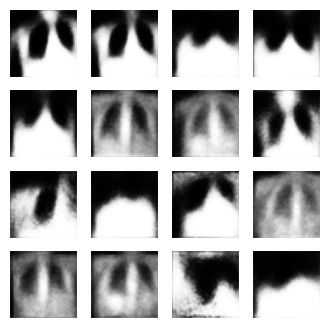

Epoch: 6, Test set ELBO: -6450.65478515625, time elapse for current epoch: 27.108133554458618


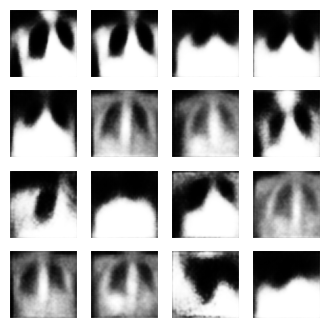

Epoch: 7, Test set ELBO: -6444.53125, time elapse for current epoch: 26.98336887359619


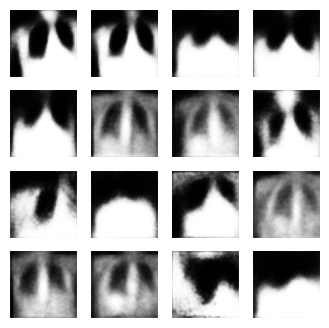

Epoch: 8, Test set ELBO: -6416.66845703125, time elapse for current epoch: 26.93948721885681


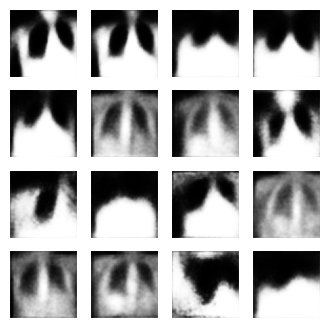

Epoch: 9, Test set ELBO: -6408.826171875, time elapse for current epoch: 26.91220498085022


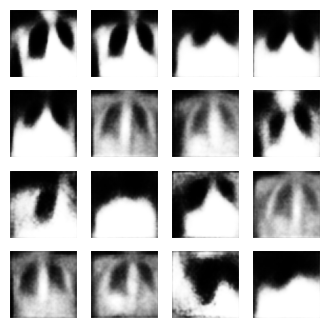

Epoch: 10, Test set ELBO: -6459.775390625, time elapse for current epoch: 26.891348838806152


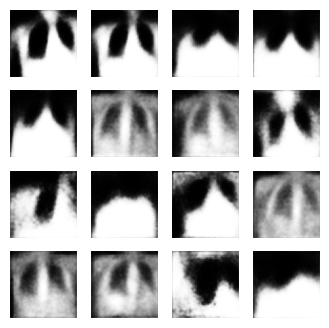

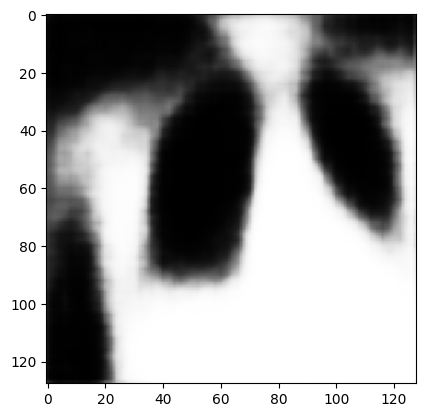

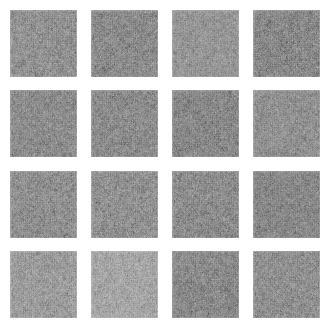

Epoch: 1, Test set ELBO: -6727.35546875, time elapse for current epoch: 28.923264265060425


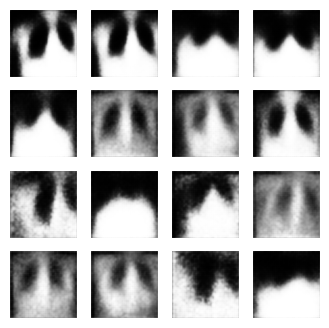

Epoch: 2, Test set ELBO: -6489.423828125, time elapse for current epoch: 27.14564538002014


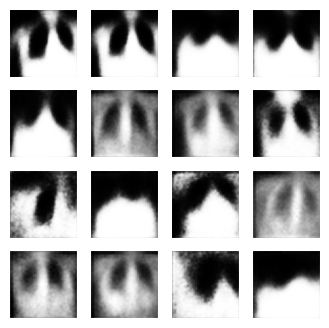

Epoch: 3, Test set ELBO: -6439.98681640625, time elapse for current epoch: 26.881319046020508


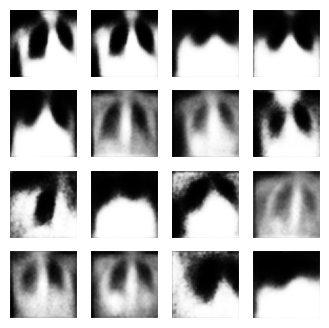

Epoch: 4, Test set ELBO: -6393.5546875, time elapse for current epoch: 26.873414039611816


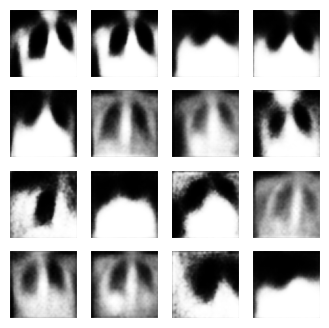

Epoch: 5, Test set ELBO: -6355.90625, time elapse for current epoch: 27.066787242889404


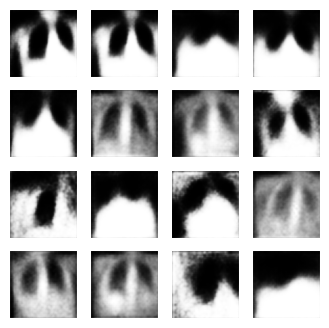

Epoch: 6, Test set ELBO: -6337.25244140625, time elapse for current epoch: 27.034318208694458


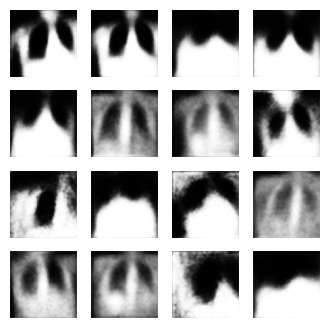

Epoch: 7, Test set ELBO: -6351.87158203125, time elapse for current epoch: 26.94859528541565


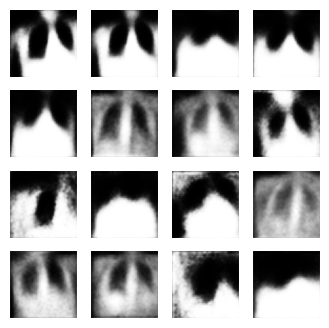

Epoch: 8, Test set ELBO: -6375.19873046875, time elapse for current epoch: 26.97718095779419


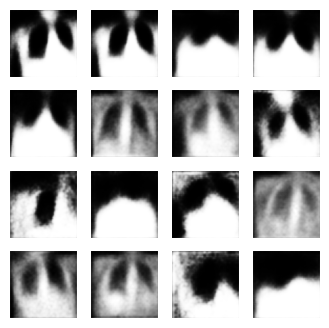

Epoch: 9, Test set ELBO: -6349.619140625, time elapse for current epoch: 27.016162395477295


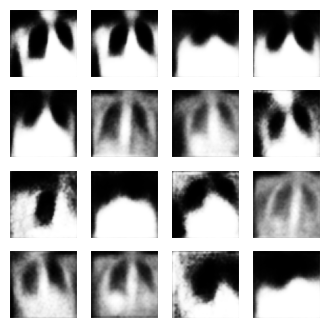

Epoch: 10, Test set ELBO: -6326.18603515625, time elapse for current epoch: 27.02562952041626


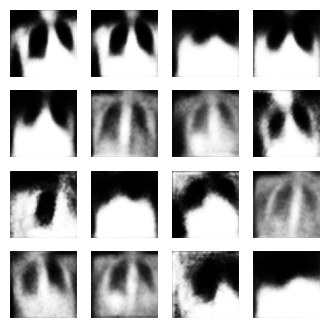

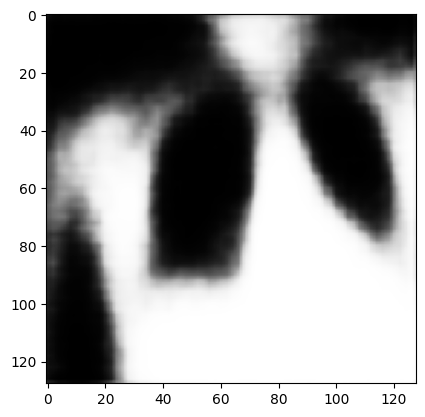

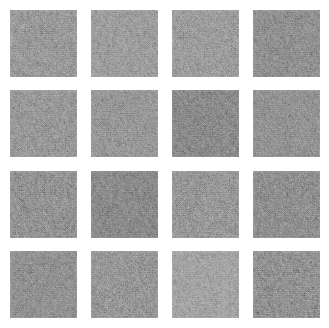

Epoch: 1, Test set ELBO: -6753.27197265625, time elapse for current epoch: 40.98139810562134


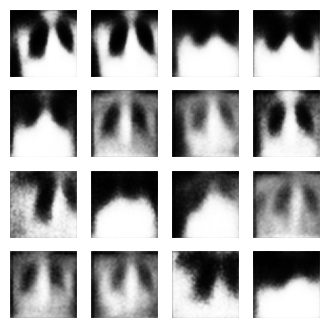

Epoch: 2, Test set ELBO: -6505.12109375, time elapse for current epoch: 27.267788410186768


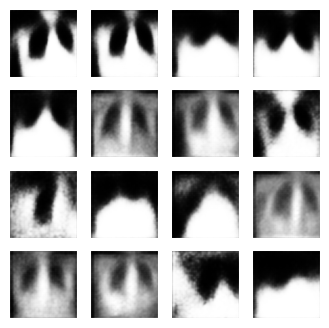

Epoch: 3, Test set ELBO: -6427.69873046875, time elapse for current epoch: 27.68635106086731


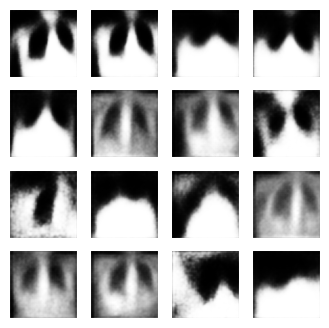

Epoch: 4, Test set ELBO: -6388.85400390625, time elapse for current epoch: 26.60899043083191


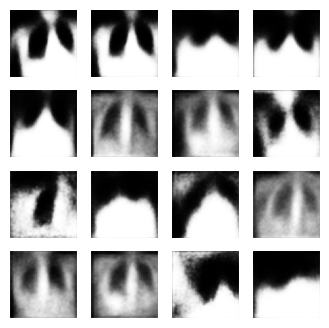

Epoch: 5, Test set ELBO: -6356.04052734375, time elapse for current epoch: 26.799975872039795


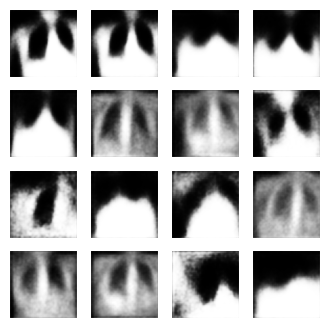

Epoch: 6, Test set ELBO: -6343.98681640625, time elapse for current epoch: 27.35748839378357


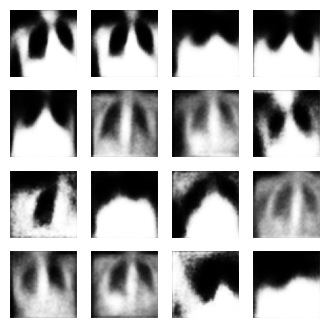

Epoch: 7, Test set ELBO: -6352.263671875, time elapse for current epoch: 26.965982913970947


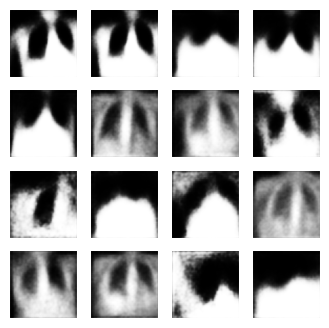

Epoch: 8, Test set ELBO: -6351.94091796875, time elapse for current epoch: 26.887900590896606


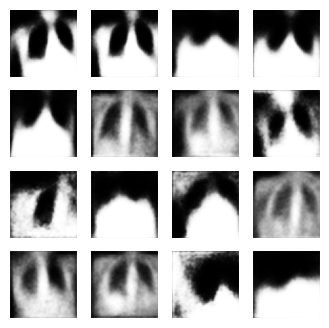

Epoch: 9, Test set ELBO: -6338.720703125, time elapse for current epoch: 27.0583815574646


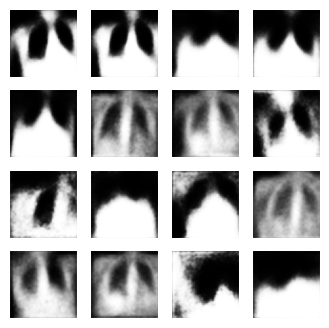

Epoch: 10, Test set ELBO: -6339.81103515625, time elapse for current epoch: 40.955753564834595


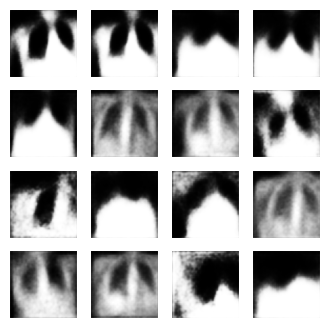

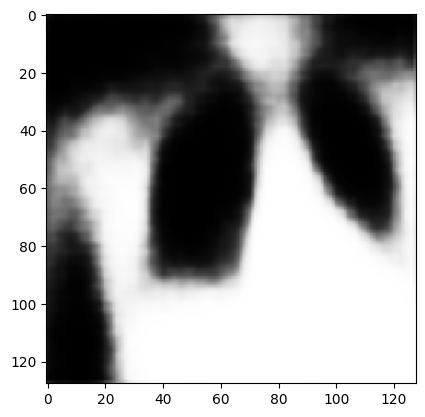

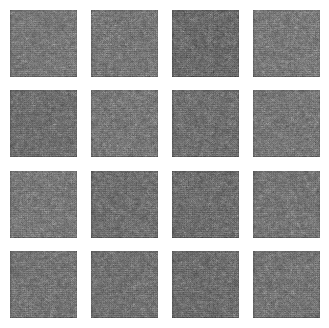

Epoch: 1, Test set ELBO: -7325.69677734375, time elapse for current epoch: 28.673340559005737


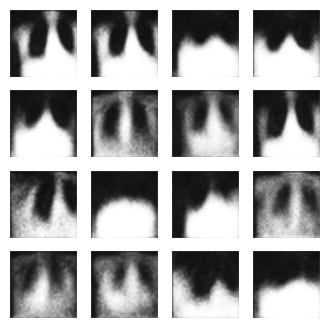

Epoch: 2, Test set ELBO: -6682.97607421875, time elapse for current epoch: 27.81211280822754


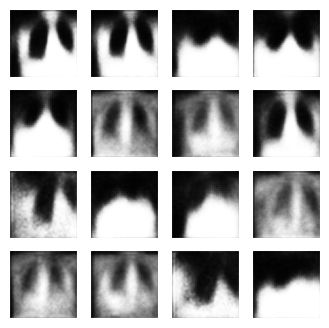

Epoch: 3, Test set ELBO: -6661.322265625, time elapse for current epoch: 26.581220388412476


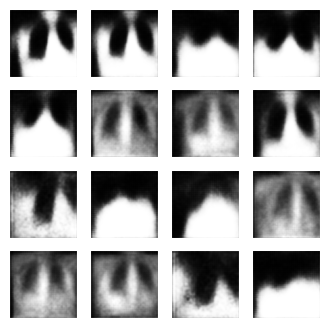

Epoch: 4, Test set ELBO: -6573.06298828125, time elapse for current epoch: 26.8671658039093


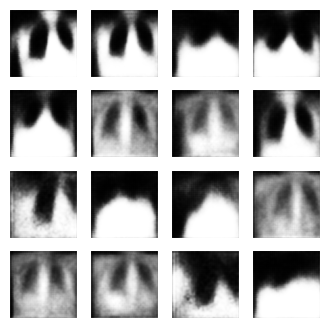

Epoch: 5, Test set ELBO: -6549.7265625, time elapse for current epoch: 27.074618339538574


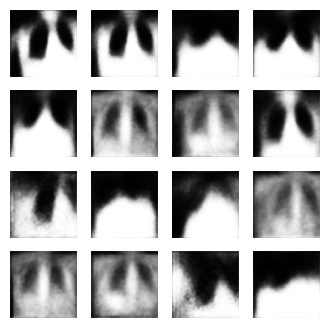

Epoch: 6, Test set ELBO: -6515.501953125, time elapse for current epoch: 26.77166247367859


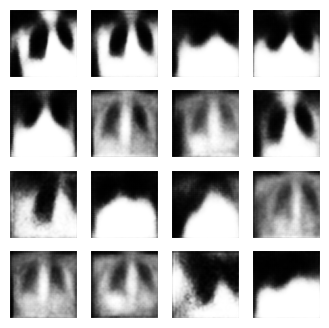

Epoch: 7, Test set ELBO: -6528.64697265625, time elapse for current epoch: 26.84871530532837


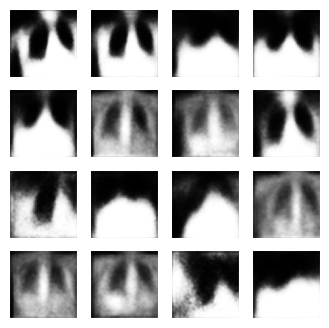

Epoch: 8, Test set ELBO: -6508.36279296875, time elapse for current epoch: 26.962969064712524


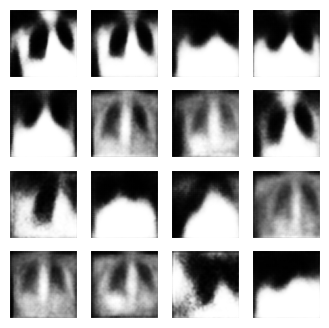

Epoch: 9, Test set ELBO: -6491.63818359375, time elapse for current epoch: 26.959879636764526


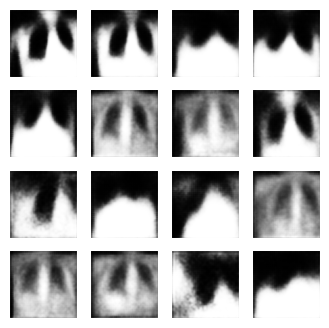

Epoch: 10, Test set ELBO: -6472.150390625, time elapse for current epoch: 26.804845571517944


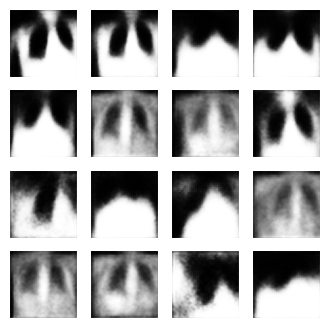

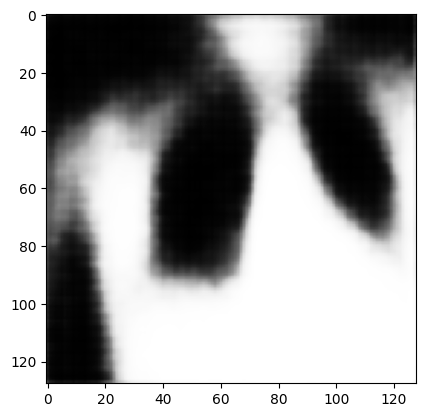

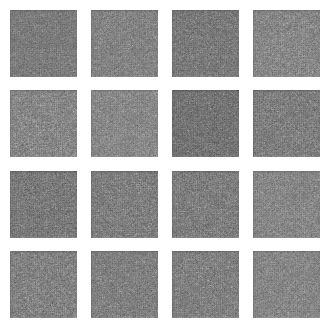

Epoch: 1, Test set ELBO: -6982.92724609375, time elapse for current epoch: 29.594799995422363


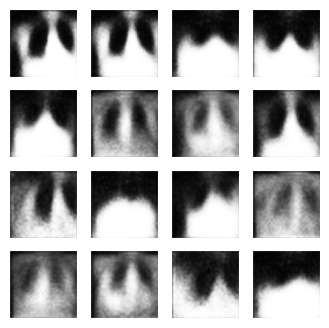

Epoch: 2, Test set ELBO: -6654.73291015625, time elapse for current epoch: 27.089928150177002


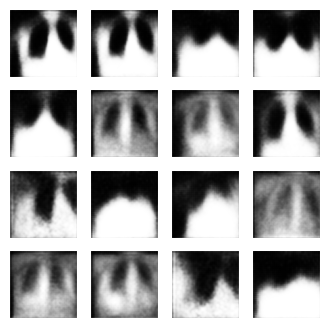

Epoch: 3, Test set ELBO: -6605.255859375, time elapse for current epoch: 26.781989097595215


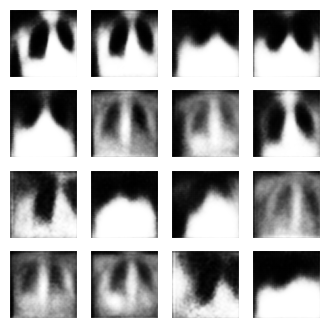

Epoch: 4, Test set ELBO: -6567.69775390625, time elapse for current epoch: 26.951805591583252


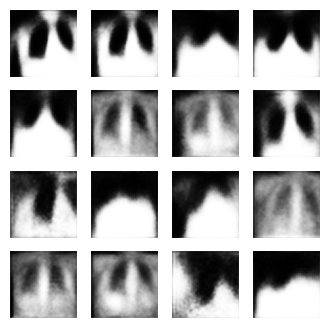

Epoch: 5, Test set ELBO: -6514.84326171875, time elapse for current epoch: 26.96262216567993


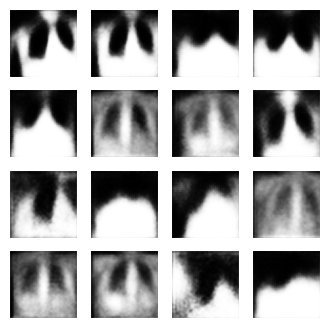

Epoch: 6, Test set ELBO: -6540.1953125, time elapse for current epoch: 26.898414611816406


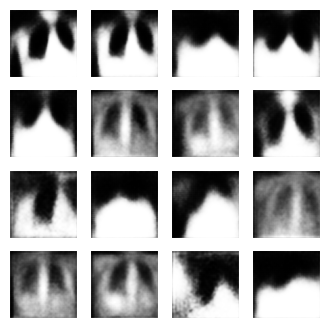

Epoch: 7, Test set ELBO: -6554.330078125, time elapse for current epoch: 26.908345460891724


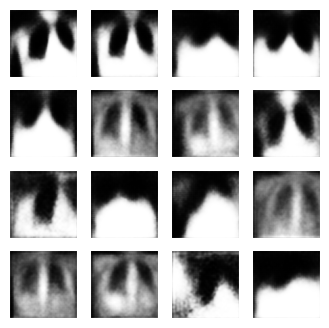

Epoch: 8, Test set ELBO: -6468.24658203125, time elapse for current epoch: 26.95885419845581


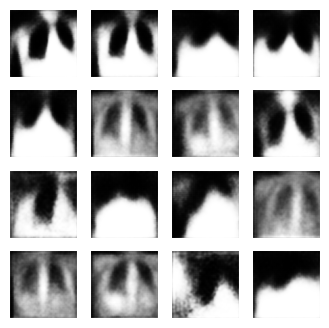

Epoch: 9, Test set ELBO: -6514.60986328125, time elapse for current epoch: 26.95232915878296


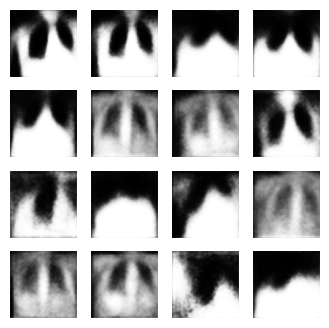

Epoch: 10, Test set ELBO: -6446.46435546875, time elapse for current epoch: 26.89762854576111


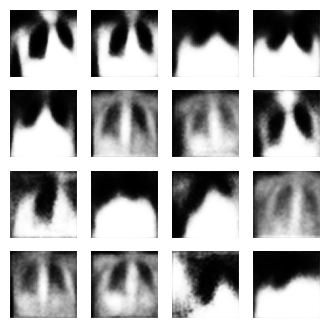

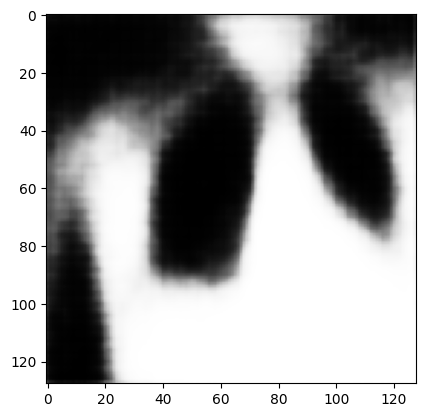

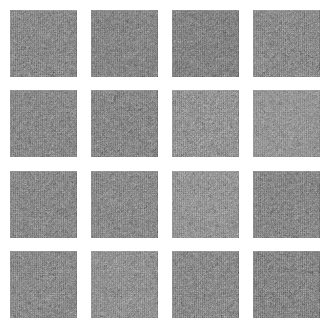

Epoch: 1, Test set ELBO: -6833.58935546875, time elapse for current epoch: 51.22319173812866


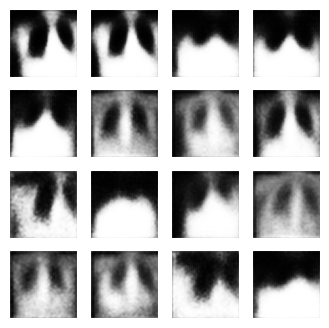

Epoch: 2, Test set ELBO: -6575.13671875, time elapse for current epoch: 41.03191089630127


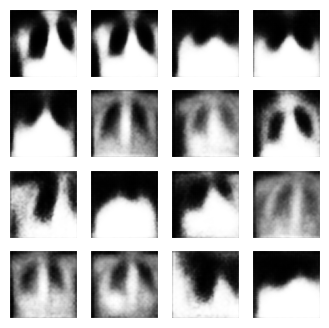

Epoch: 3, Test set ELBO: -6489.31884765625, time elapse for current epoch: 41.255725145339966


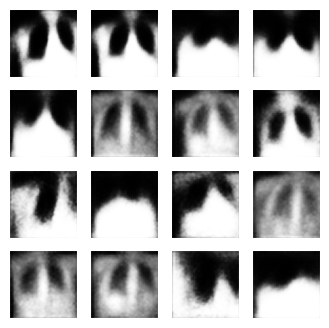

Epoch: 4, Test set ELBO: -6434.43603515625, time elapse for current epoch: 41.41407775878906


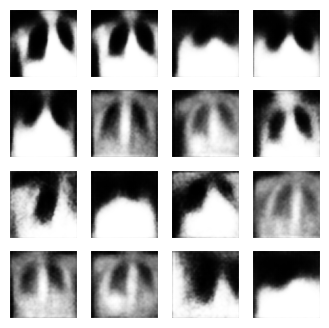

Epoch: 5, Test set ELBO: -6436.11181640625, time elapse for current epoch: 41.19378685951233


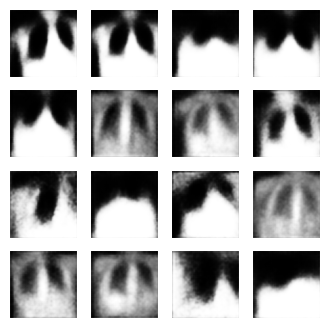

Epoch: 6, Test set ELBO: -6430.51171875, time elapse for current epoch: 41.35401773452759


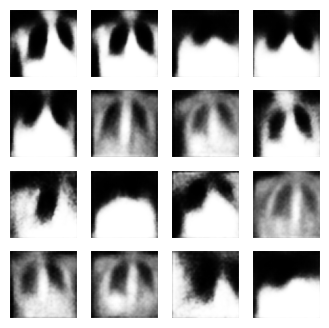

Epoch: 7, Test set ELBO: -6384.09765625, time elapse for current epoch: 41.10938358306885


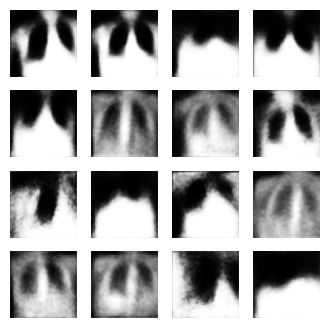

Epoch: 8, Test set ELBO: -6400.37841796875, time elapse for current epoch: 41.3459951877594


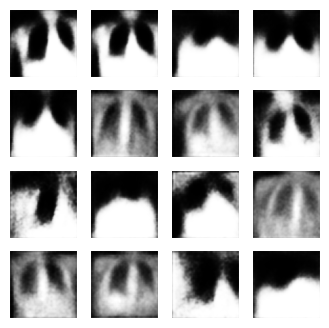

Epoch: 9, Test set ELBO: -6392.162109375, time elapse for current epoch: 41.08424949645996


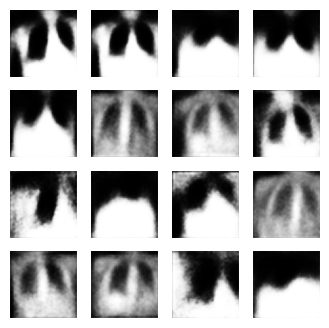

Epoch: 10, Test set ELBO: -6393.38037109375, time elapse for current epoch: 41.08056974411011


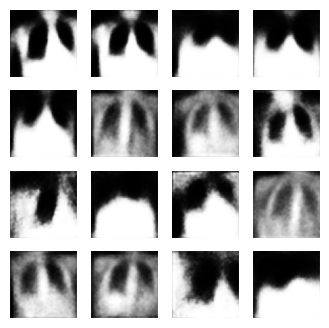

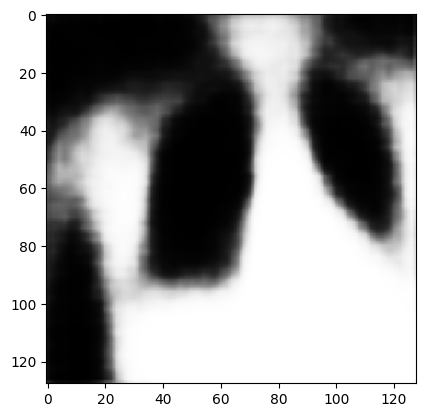

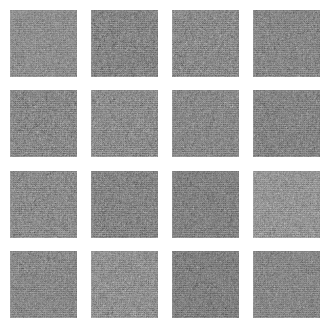

Epoch: 1, Test set ELBO: -6927.10888671875, time elapse for current epoch: 43.16783547401428


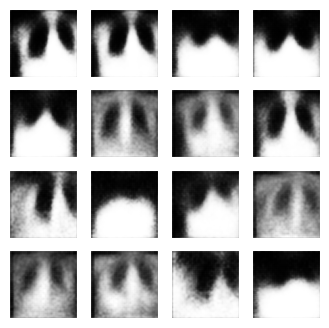

Epoch: 2, Test set ELBO: -6569.375, time elapse for current epoch: 41.128918409347534


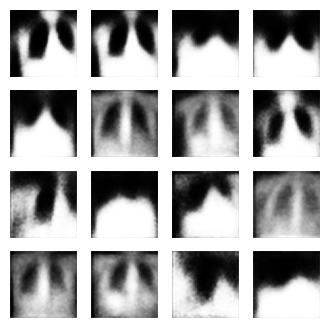

Epoch: 3, Test set ELBO: -6475.318359375, time elapse for current epoch: 41.448182582855225


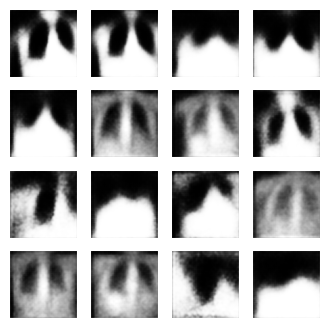

Epoch: 4, Test set ELBO: -6445.736328125, time elapse for current epoch: 41.19007992744446


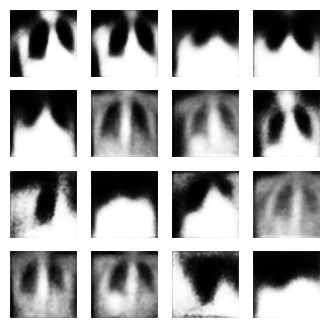

Epoch: 5, Test set ELBO: -6429.00048828125, time elapse for current epoch: 41.1490523815155


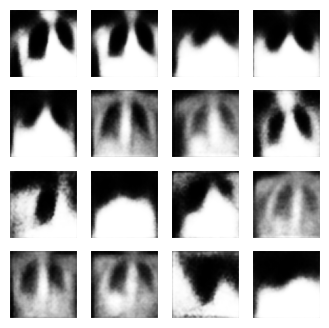

Epoch: 6, Test set ELBO: -6405.43896484375, time elapse for current epoch: 41.20156478881836


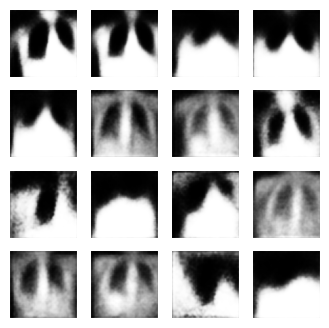

Epoch: 7, Test set ELBO: -6399.47900390625, time elapse for current epoch: 41.284257888793945


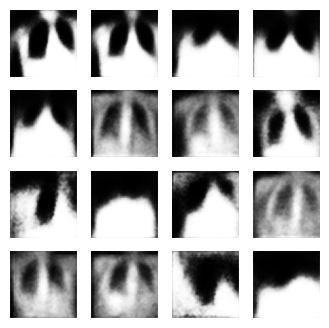

Epoch: 8, Test set ELBO: -6409.20947265625, time elapse for current epoch: 41.366557121276855


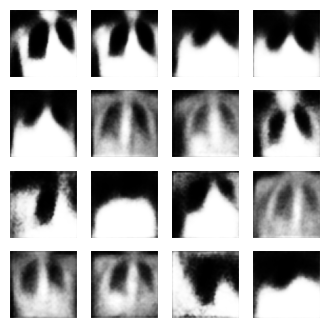

Epoch: 9, Test set ELBO: -6432.85791015625, time elapse for current epoch: 41.37793040275574


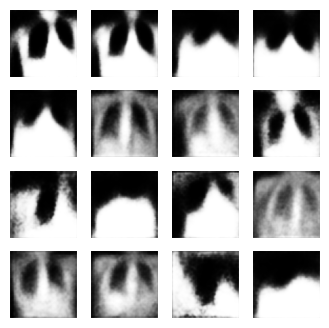

Epoch: 10, Test set ELBO: -6394.109375, time elapse for current epoch: 41.289894342422485


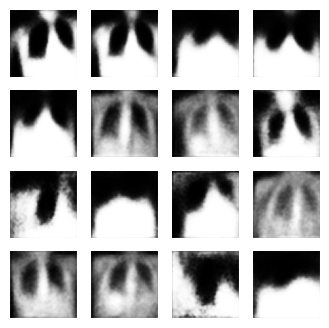

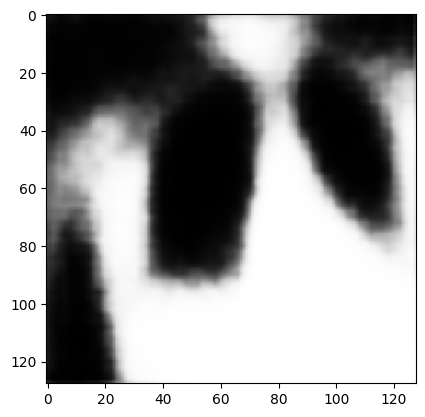

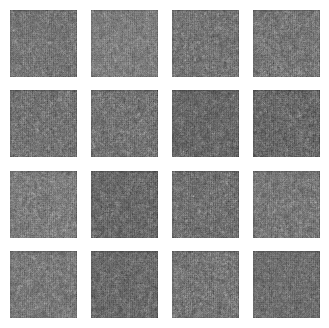

Epoch: 1, Test set ELBO: -7141.56494140625, time elapse for current epoch: 43.264591693878174


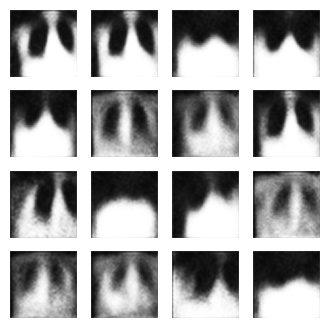

Epoch: 2, Test set ELBO: -6701.60107421875, time elapse for current epoch: 41.07510232925415


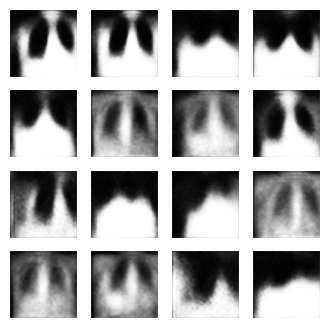

Epoch: 3, Test set ELBO: -6658.20166015625, time elapse for current epoch: 41.38681411743164


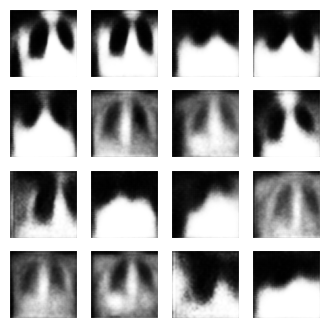

Epoch: 4, Test set ELBO: -6612.21240234375, time elapse for current epoch: 41.03098225593567


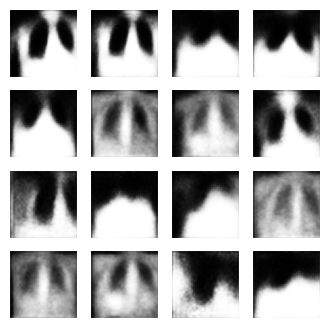

Epoch: 5, Test set ELBO: -6550.85693359375, time elapse for current epoch: 41.25878095626831


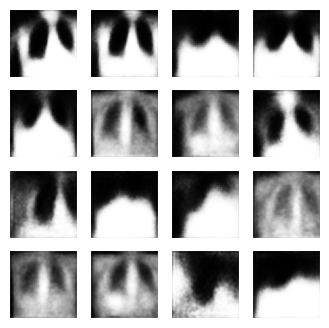

Epoch: 6, Test set ELBO: -6588.83740234375, time elapse for current epoch: 41.07433199882507


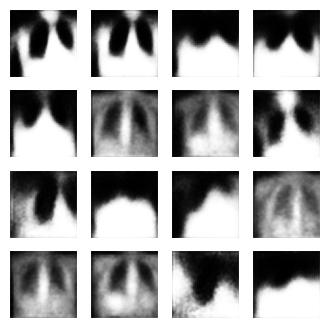

Epoch: 7, Test set ELBO: -6533.02392578125, time elapse for current epoch: 40.966275691986084


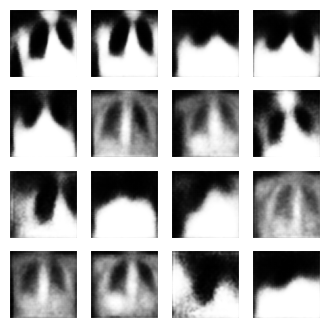

Epoch: 8, Test set ELBO: -6547.86865234375, time elapse for current epoch: 40.99920916557312


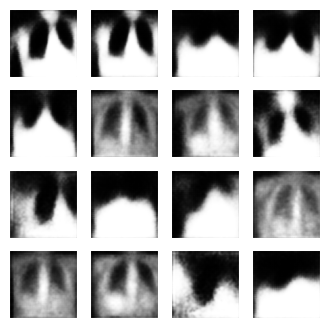

Epoch: 9, Test set ELBO: -6506.81640625, time elapse for current epoch: 41.03689432144165


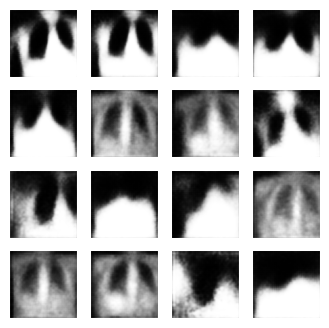

Epoch: 10, Test set ELBO: -6540.21484375, time elapse for current epoch: 41.03035593032837


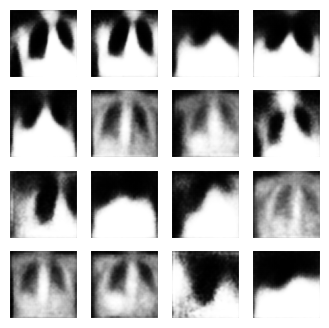

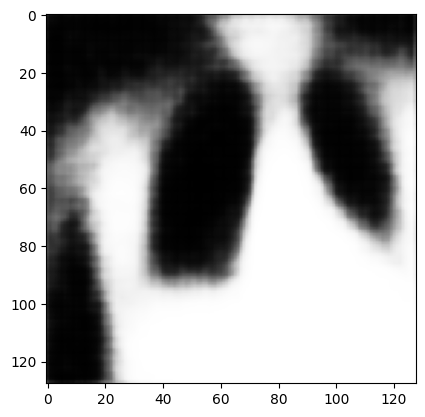

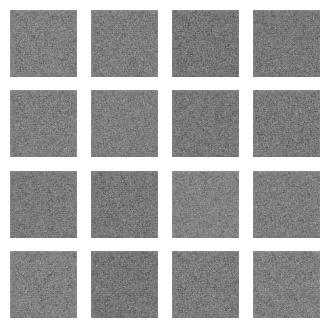

Epoch: 1, Test set ELBO: -6810.63037109375, time elapse for current epoch: 43.18944430351257


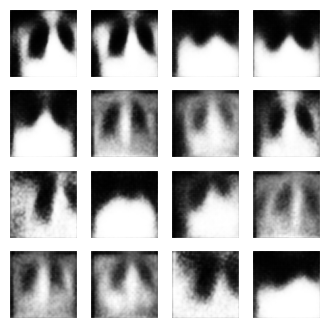

Epoch: 2, Test set ELBO: -6555.08544921875, time elapse for current epoch: 41.210679054260254


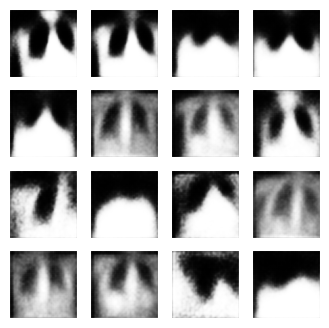

Epoch: 3, Test set ELBO: -6440.85693359375, time elapse for current epoch: 41.44575262069702


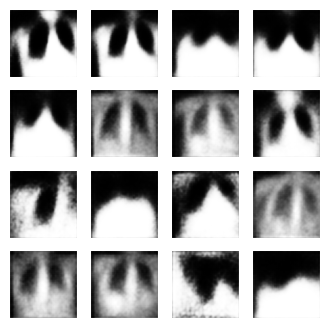

Epoch: 4, Test set ELBO: -6403.00146484375, time elapse for current epoch: 41.321043252944946


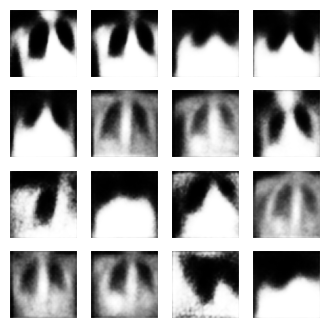

Epoch: 5, Test set ELBO: -6377.47021484375, time elapse for current epoch: 41.2327606678009


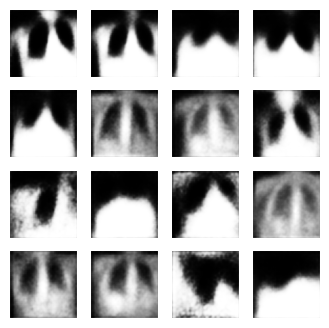

Epoch: 6, Test set ELBO: -6376.07958984375, time elapse for current epoch: 41.43305683135986


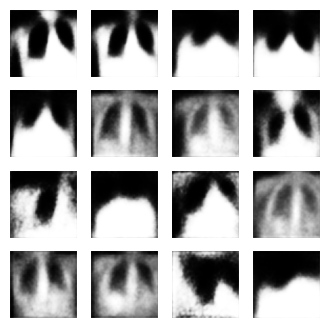

Epoch: 7, Test set ELBO: -6370.55322265625, time elapse for current epoch: 41.26863193511963


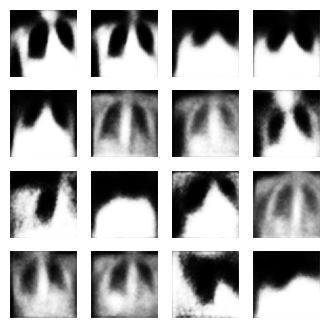

Epoch: 8, Test set ELBO: -6392.884765625, time elapse for current epoch: 41.17931914329529


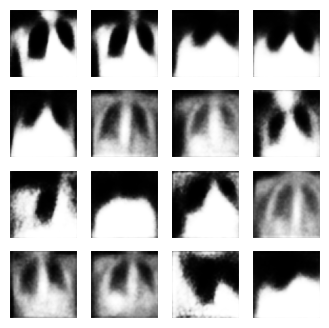

Epoch: 9, Test set ELBO: -6366.46875, time elapse for current epoch: 41.17301535606384


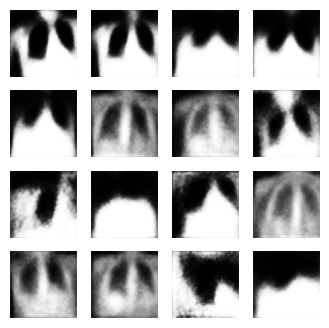

Epoch: 10, Test set ELBO: -6377.431640625, time elapse for current epoch: 41.199124574661255


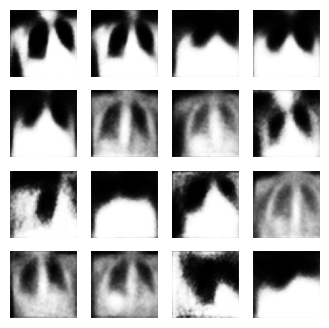

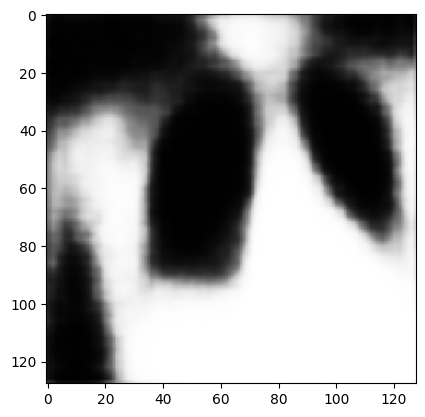

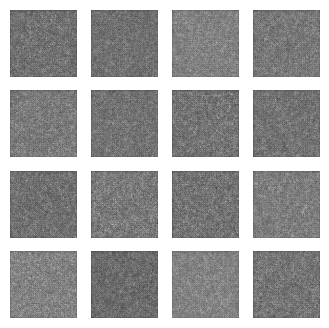

Epoch: 1, Test set ELBO: -7067.1796875, time elapse for current epoch: 43.450106143951416


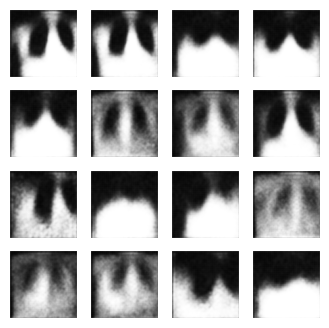

Epoch: 2, Test set ELBO: -6640.39990234375, time elapse for current epoch: 41.11402869224548


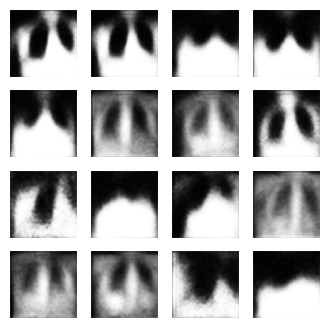

Epoch: 3, Test set ELBO: -6577.15625, time elapse for current epoch: 41.368573904037476


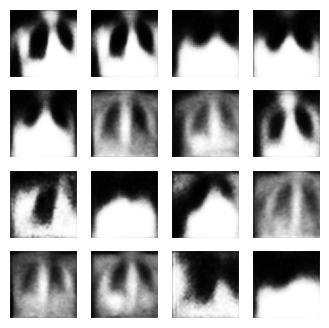

Epoch: 4, Test set ELBO: -6505.85107421875, time elapse for current epoch: 41.18179106712341


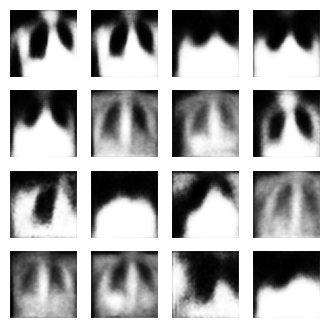

Epoch: 5, Test set ELBO: -6557.91845703125, time elapse for current epoch: 41.24738883972168


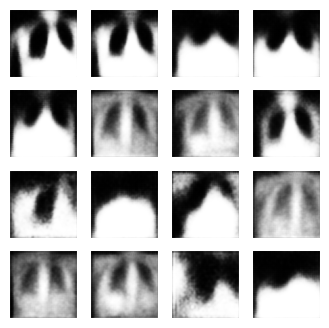

Epoch: 6, Test set ELBO: -6472.75537109375, time elapse for current epoch: 41.30755281448364


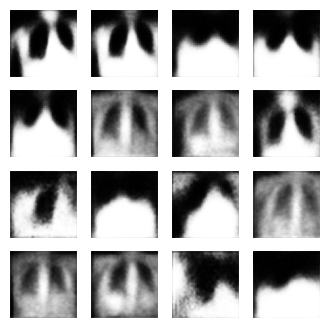

Epoch: 7, Test set ELBO: -6451.84814453125, time elapse for current epoch: 41.26077175140381


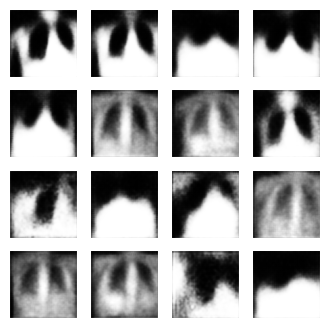

Epoch: 8, Test set ELBO: -6475.39208984375, time elapse for current epoch: 41.22718811035156


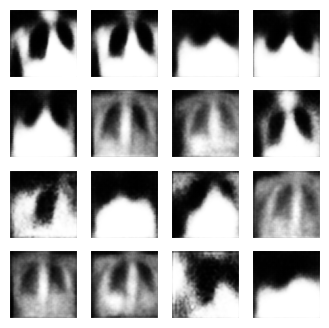

Epoch: 9, Test set ELBO: -6453.41015625, time elapse for current epoch: 41.29437828063965


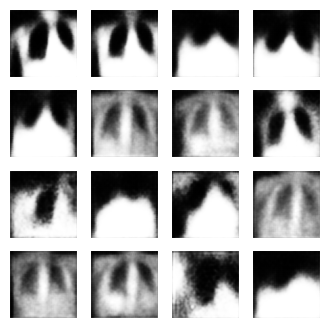

Epoch: 10, Test set ELBO: -6442.97412109375, time elapse for current epoch: 41.017648696899414


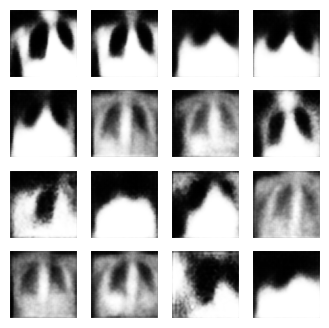

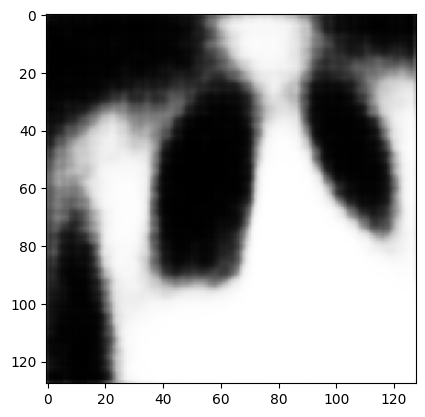

In [ ]:


for filterNum in [1,2,3,4]:
  numKfold = 5
  epochs = 10
  latent_dim = 8
  num_examples_to_generate = 16
  batchSize = 31
  totalError = np.empty(shape=(numKfold,batchSize-1))
  for kFold in range(numKfold):
    #________MODEL___________
    class CVAE(tf.keras.Model):
      """Convolutional variational autoencoder."""

      def __init__(self, latent_dim):
        super(CVAE, self).__init__()
        self.latent_dim = latent_dim
        self.encoder = tf.keras.Sequential(
            [
                tf.keras.layers.InputLayer(input_shape=(128, 128, 1)),
                tf.keras.layers.Conv2D(
                    filters=32*filterNum, kernel_size=3, strides=(2, 2), activation='relu'),
                tf.keras.layers.Conv2D(
                    filters=64*filterNum, kernel_size=3, strides=(2, 2), activation='relu'),
                tf.keras.layers.Flatten(),
                # No activation
                tf.keras.layers.Dense(latent_dim + latent_dim),
            ]
        )

        self.decoder = tf.keras.Sequential(
            [
                tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
                tf.keras.layers.Dense(units=32*32*32, activation=tf.nn.relu),
                tf.keras.layers.Reshape(target_shape=(32, 32, 32)),
                tf.keras.layers.Conv2DTranspose(
                    filters=64*filterNum, kernel_size=3, strides=2, padding='same',
                    activation='relu'),
                tf.keras.layers.Conv2DTranspose(
                    filters=32*filterNum, kernel_size=3, strides=2, padding='same',
                    activation='relu'),
                # No activation
                tf.keras.layers.Conv2DTranspose(
                    filters=1, kernel_size=3, strides=1, padding='same'),
            ]
        )

      @tf.function
      def sample(self, eps=None):
        if eps is None:
          eps = tf.random.normal(shape=(100, self.latent_dim))
        return self.decode(eps, apply_sigmoid=True)

      def encode(self, x):
        mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
        return mean, logvar

      def reparameterize(self, mean, logvar):
        eps = tf.random.normal(shape=mean.shape)
        return eps * tf.exp(logvar * .5) + mean

      def decode(self, z, apply_sigmoid=False):
        logits = self.decoder(z)
        if apply_sigmoid:
          probs = tf.sigmoid(logits)
          return probs
        return logits

    optimizer = tf.keras.optimizers.Adam(1e-4)


    def log_normal_pdf(sample, mean, logvar, raxis=1):
      log2pi = tf.math.log(2. * np.pi)
      return tf.reduce_sum(
          -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi),
          axis=raxis)


    def compute_loss(model, x):
      mean, logvar = model.encode(x)
      z = model.reparameterize(mean, logvar)
      x_logit = model.decode(z)
      cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x)
      logpx_z = -tf.reduce_sum(cross_ent, axis=[1, 2, 3])
      logpz = log_normal_pdf(z, 0., 0.)
      logqz_x = log_normal_pdf(z, mean, logvar)
      return -tf.reduce_mean(logpx_z + logpz - logqz_x)


    @tf.function
    def train_step(model, x, optimizer):
      """Executes one training step and returns the loss.

      This function computes the loss and gradients, and uses the latter to
      update the model's parameters.
      """
      with tf.GradientTape() as tape:
        loss = compute_loss(model, x)
      gradients = tape.gradient(loss, model.trainable_variables)
      optimizer.apply_gradients(zip(gradients, model.trainable_variables))

    random_vector_for_generation = tf.random.normal(
      shape=[num_examples_to_generate, latent_dim])
    model = CVAE(latent_dim)

    assert batch_size >= num_examples_to_generate
    for test_batch in test_dataset.take(1):
      test_sample = test_batch[0:num_examples_to_generate, :, :, :]
    #_______________

    generate_and_save_images(model, 0, test_sample)

    for epoch in range(1, epochs + 1):
      start_time = time.time()
      for train_x in train_dataset:
        train_step(model, train_x, optimizer)
      end_time = time.time()

      loss = tf.keras.metrics.Mean()
      for test_x in test_dataset:
        loss(compute_loss(model, test_x))
      elbo = -loss.result()
      #display.clear_output(wait=False)
      print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'
            .format(epoch, elbo, end_time - start_time))
      generate_and_save_images(model, epoch, test_sample)

    OrigionalImages = np.empty(shape=(batchSize, 128,128))
    VAEGeneratedImages = np.empty(shape=(batchSize, 128,128))

    for imageNum in range(batchSize):
      #For recreating images from testing set to compare to VAE produced
      test_image = test_batch[imageNum, :, :,:].numpy()
      normalized_image = (test_image-np.min(test_image))/(np.max(test_image)-np.min(test_image))
      OrigionalImages[imageNum] = test_image.reshape((128, 128))
      #For producing images that have been encoded and decoded by the VAE
      VAEAlteredImage = test_batch[imageNum:imageNum+1, :, :,:].numpy()
      mean, logvar = model.encode(VAEAlteredImage)
      z = model.reparameterize(mean, logvar)
      predictions = model.sample(z)
      VAEGeneratedImages[imageNum] = tf.reshape(predictions[0], (128, 128))

    plt.imshow(OrigionalImages[0],cmap='Greys_r')
    plt.imshow( VAEGeneratedImages[0],cmap='Greys_r')

    #For directly comparing the error between the origional and produce dimages
    for imageNum in range(batchSize -1 ):
      for col in range(128):
        for row in range(128):
          totalError[kFold, imageNum] += abs(OrigionalImages[imageNum][col,row] - VAEGeneratedImages[imageNum][col,row])
  np.save("/content/drive/MyDrive/AllDICOM/Filter" + str(filterNum), totalError)


